# Before Starting:

If you liked this kernel please don't forget to upvote the project, this will keep me motivated to other kernels in the future. I hope you enjoy our deep exploration into this dataset. Let's begin!

# **Credit Card Fraud Detection**
**Anonymized credit card transactions labeled as fraudulent or genuine**

<img src="https://i.imgur.com/lBuWqxx.png" />

# Table of Contents

- [Credit Card Fraud Detection Introduction](#introduction)
- [Dataset Understanding](#dataset)
- [Exploratory Data Analysis](#eda)
    - [Feature Scaling](#feature)
    - [Concise Summary](#info)
    - [Uique Labels](#unique)
    - [Descriptive Statistics](#describe)
    - [Finding null values](#null)
    - [Distribution of Amount](#amountdist)
    - [Removal of Outliers](#outliers)
    - [Categorical vs Continuous Features](#catcont)
    - [Correlation Among Explanatory Variables](#corr)
- [Feature Engineering](#feateng)
    - [Feature engineering on Time](#timefeateng)
- [Scaling](#scaleamount)
    - [Scale amount by Log](#scalelog)
    - [Scale  amount by Standardization](#scalestand)
    - [Scale  amount by Normalization](scalenorm)
- [Saving preprossed data](#pickle)
- [Split data](#splitdata)
- [Baseline for models](#modelbaseline)
- [Class Imbalance](#classimbalance)
    - [Under Sampling and Over Sampling](#undovrsamp)
    - [Synthetic Minority OverSampling Technique (SMOTE)](#smote)
    - [Adaptive Synthetic Sampling Method for Imbalanced Data (ADASYN)](#adasyn)
- [Model Building](#modelbuild)
    - [Logistic Regression](#logreg)
        - [Logistic Regression with imbalanced data](#logregim)
            - [Model Evolution](#modevel)
            - [Model Evolution Matrix](#modevelmatrix)
            - [Receiver Operating Characteristics (ROC)](#roccurve)
        - [Logistic Regression with Random Undersampling technique](#logregundsamp)
        - [Logistic Regression with Random Oversampling technique](#logregovrsamp)
        - [Logistic Regression with SMOTE technique](#logregsomote)
        - [Logistic Regression with ADASYN technique](#logregadasyn)
- [Spatial nature of class imbalance](#spatial)
    - [Distribution of balaced dataset](#distimbds)
    - [Distribution of balaced dataset](#distbalds)
- [Building different models with different balanced datasets](#modelwith)
    - [Undersampled Data](#usdata)
    - [Oversampled Data](#osdata)
    - [SMOTE Data](#smotedata)
    - [ADASYN Data](#adasyndata)
- [Grid Search](#)
    - [Grid Search with Logistic Regression](#gridsearchLR)
    - [Grid Search with K Nearest Neighbour Classifier](#gridsearchKNN)
    - [Grid Search with Support Vector Classifier](#gridsearchSVC)
    - [Grid Search with Decision Tree Classifier](#gridsearchDT)
- [Conclusion](#concl)

# <a id='introduction'>Introduction</a>

It is important that credit card companies are able to recognize fraudulent credit card transactions so that customers are not charged for items that they did not purchase. Eventually, it is also important for companies NOT to detect transactions which are genuine as fraudulent, otherwise, companies would keep blocking the credit card, and which may lead to customer dissatisfaction. So here are two important expects of this analysis:

* What would happen when the company will not able to detect the fraudulent transaction and would not confirm from a customer about this recent transaction whether it was made by him/her.

* In contract, what would happen when the company will detect a genuine transaction as fraudulent and keep calling customer for confirmation or might block the card.

The datasets contain transactions that have 492 frauds out of 284,807 transactions. So the dataset is highly unbalanced, the positive class (frauds) account for 0.172% of all transactions. When we try to build the prediction model with this kind of unbalanced dataset, then the model will be more inclined towards to detect new unseen transaction as genuine as our dataset contains about 99% genuine data.

As our dataset is highly imbalanced, so we shouldn't use accuracy score as a metric because it will be usually high and misleading, instead use we should focus on f1-score, precision/recall score or confusion matrix.

# <a id='dataset'>Load Data</a>

In [1]:
# Import Libraries
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
# import cufflinks as cf
import plotly
import datetime
import math
import matplotlib
import sklearn
from IPython.display import HTML
from IPython.display import YouTubeVideo

import pickle
import os

import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots

# Print versions of libraries
print(f"Numpy version : Numpy {np.__version__}")
print(f"Pandas version : Pandas {pd.__version__}")
print(f"Matplotlib version : Matplotlib {matplotlib.__version__}")
print(f"Seaborn version : Seaborn {sns.__version__}")
print(f"SkLearn version : SkLearn {sklearn.__version__}")
# print(f"Cufflinks version : cufflinks {cf.__version__}")
print(f"Plotly version : plotly {plotly.__version__}")

# Magic Functions for In-Notebook Display
%matplotlib inline

# Setting seabon style
sns.set(style='darkgrid', palette='colorblind')

Numpy version : Numpy 1.18.1
Pandas version : Pandas 1.0.3
Matplotlib version : Matplotlib 3.2.1
Seaborn version : Seaborn 0.10.0
SkLearn version : SkLearn 0.23.1
Plotly version : plotly 4.8.1


## Import the Dataset

In [2]:
df = pd.read_csv('../input/creditcardfraud/creditcard.csv', encoding='latin_1')

In [3]:
# Converting all column names to lower case
df.columns = df.columns.str.lower()

In [4]:
df.head()

,time,v1,v2,v3,v4,v5,v6,v7,v8,v9,...,v21,v22,v23,v24,v25,v26,v27,v28,amount,class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [5]:
df.tail()

,time,v1,v2,v3,v4,v5,v6,v7,v8,v9,...,v21,v22,v23,v24,v25,v26,v27,v28,amount,class
284802,172786.0,-11.881118,10.071785,-9.834783,-2.066656,-5.364473,-2.606837,-4.918215,7.305334,1.914428,...,0.213454,0.111864,1.014480,-0.509348,1.436807,0.250034,0.943651,0.823731,0.77,0
284803,172787.0,-0.732789,-0.055080,2.035030,-0.738589,0.868229,1.058415,0.024330,0.294869,0.584800,...,0.214205,0.924384,0.012463,-1.016226,-0.606624,-0.395255,0.068472,-0.053527,24.79,0
284804,172788.0,1.919565,-0.301254,-3.249640,-0.557828,2.630515,3.031260,-0.296827,0.708417,0.432454,...,0.232045,0.578229,-0.037501,0.640134,0.265745,-0.087371,0.004455,-0.026561,67.88,0
284805,172788.0,-0.240440,0.530483,0.702510,0.689799,-0.377961,0.623708,-0.686180,0.679145,0.392087,...,0.265245,0.800049,-0.163298,0.123205,-0.569159,0.546668,0.108821,0.104533,10.00,0
284806,172792.0,-0.533413,-0.189733,0.703337,-0.506271,-0.012546,-0.649617,1.577006,-0.414650,0.486180,...,0.261057,0.643078,0.376777,0.008797,-0.473649,-0.818267,-0.002415,0.013649,217.00,0


* **Due to confidentiality issue, original features V1, V2,... V28 have been transformed with PCA, however, we may guess that these features might be originally credit card number, expiry date, CVV, cardholder name, transaction location, transaction date-time, etc.** 

* The only features which have not been transformed with PCA are 'Time' and 'Amount'. Feature 'Time' contains the seconds elapsed between each transaction and the first transaction in the dataset. The feature 'Amount' is the transaction Amount, this feature can be used for example-dependant cost-sensitive learning. 

* Feature 'Class' is the response variable and it takes value 1 in case of fraud and 0 otherwise.

In [6]:
# Customising default values to view all columns
pd.options.display.max_rows = 100
pd.options.display.max_columns = 100

# pd.set_option('display.max_rows',1000)

In [7]:
df.head(10)

,time,v1,v2,v3,v4,v5,v6,v7,v8,v9,v10,v11,v12,v13,v14,v15,v16,v17,v18,v19,v20,v21,v22,v23,v24,v25,v26,v27,v28,amount,class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,1.612727,1.065235,0.489095,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,0.624501,0.066084,0.717293,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,-0.226487,0.178228,0.507757,-0.287924,-0.631418,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,-0.822843,0.538196,1.345852,-1.119670,0.175121,-0.451449,-0.237033,-0.038195,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0
5,2.0,-0.425966,0.960523,1.141109,-0.168252,0.420987,-0.029728,0.476201,0.260314,-0.568671,-0.371407,1.341262,0.359894,-0.358091,-0.137134,0.517617,0.401726,-0.058133,0.068653,-0.033194,0.084968,-0.208254,-0.559825,-0.026398,-0.371427,-0.232794,0.105915,0.253844,0.081080,3.67,0
6,4.0,1.229658,0.141004,0.045371,1.202613,0.191881,0.272708,-0.005159,0.081213,0.464960,-0.099254,-1.416907,-0.153826,-0.751063,0.167372,0.050144,-0.443587,0.002821,-0.611987,-0.045575,-0.219633,-0.167716,-0.270710,-0.154104,-0.780055,0.750137,-0.257237,0.034507,0.005168,4.99,0
7,7.0,-0.644269,1.417964,1.074380,-0.492199,0.948934,0.428118,1.120631,-3.807864,0.615375,1.249376,-0.619468,0.291474,1.757964,-1.323865,0.686133,-0.076127,-1.222127,-0.358222,0.324505,-0.156742,1.943465,-1.015455,0.057504,-0.649709,-0.415267,-0.051634,-1.206921,-1.085339,40.80,0
8,7.0,-0.894286,0.286157,-0.113192,-0.271526,2.669599,3.721818,0.370145,0.851084,-0.392048,-0.410430,-0.705117,-0.110452,-0.286254,0.074355,-0.328783,-0.210077,-0.499768,0.118765,0.570328,0.052736,-0.073425,-0.268092,-0.204233,1.011592,0.373205,-0.384157,0.011747,0.142404,93.20,0
9,9.0,-0.338262,1.119593,1.044367,-0.222187,0.499361,-0.246761,0.651583,0.069539,-0.736727,-0.366846,1.017614,0.836390,1.006844,-0.443523,0.150219,0.739453,-0.540980,0.476677,0.451773,0.203711,-0.246914,-0.633753,-0.120794,-0.385050,-0.069733,0.094199,0.246219,0.083076,3.68,0


# <a id='eda'>Exploratory Data Analysis</a>

Once the data is read into python, we need to explore/clean/filter it before processing it for machine learning It involves adding/deleting few columns or rows, joining some other data, and handling qualitative variables like dates.

Now that we have the data, I wanted to run a few initial comparisons between the three columns - Time, Amount, and Class.

## <a id='info'>Checking concise summary of dataset</a>

It is also a good practice to know the features and their corresponding data types, along with finding whether they contain null values or not.

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   time    284807 non-null  float64
 1   v1      284807 non-null  float64
 2   v2      284807 non-null  float64
 3   v3      284807 non-null  float64
 4   v4      284807 non-null  float64
 5   v5      284807 non-null  float64
 6   v6      284807 non-null  float64
 7   v7      284807 non-null  float64
 8   v8      284807 non-null  float64
 9   v9      284807 non-null  float64
 10  v10     284807 non-null  float64
 11  v11     284807 non-null  float64
 12  v12     284807 non-null  float64
 13  v13     284807 non-null  float64
 14  v14     284807 non-null  float64
 15  v15     284807 non-null  float64
 16  v16     284807 non-null  float64
 17  v17     284807 non-null  float64
 18  v18     284807 non-null  float64
 19  v19     284807 non-null  float64
 20  v20     284807 non-null  float64
 21  v21     28

**Highlights**

* Dataset contains details of 284807 transactions with 31 features.
* There is no missing data in our dataset, every column contain exactly 284807 rows.
* All data types are float64, except 1: Class 
* All data types are float64, except 1: Class 
* 28 columns have Sequential Names and values that don't make any logical sense - > V1, V2 ....V28
* 3 columns: TIME, AMOUNT and CLASS which can be analysed for various INSIGHTS! 
* Memory Usage: 67.4 MB, not so Harsh !!

## <a id='unique'>Count unique values of label</a>

In [9]:
print(df['class'].value_counts())
print('\n')
print(df['class'].value_counts(normalize=True))

0    284315
1       492
Name: class, dtype: int64


0    0.998273
1    0.001727
Name: class, dtype: float64


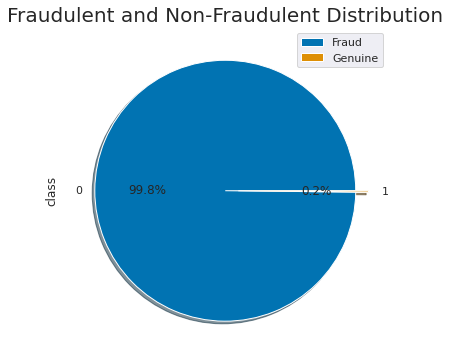

In [10]:
df["class"].value_counts().plot(kind = 'pie',explode=[0, 0.1],figsize=(6, 6),autopct='%1.1f%%',shadow=True)
plt.title("Fraudulent and Non-Fraudulent Distribution",fontsize=20)
plt.legend(["Fraud", "Genuine"])
plt.show()

**Highlights**

This dataset has 492 frauds out of 284,315 transactions. The dataset is **highly unbalanced**, the positive class (frauds) account for 0.172% of all transactions. Most of the transactions are non-fraud. If we use this dataframe as the base for our predictive models and analysis, our algorithms will probably overfit since it will "assume" that most transactions are not a fraud. But we don't want our model to assume, we want our model to detect patterns that give signs of fraud!

## <a id='describe'>Generate descriptive statistics</a>

The describe() function generates descriptive statistics that summarize the central tendency, dispersion and shape of a dataset's distribution, excluding ``NaN`` values.

Let's summarize the central tendency, dispersion and shape of a dataset's distribution. Out of all the columns, the only ones that made the most sense were Time, Amount, and Class (fraud or not fraud). The other 28 columns were transformed using what seems to be a PCA dimensionality reduction in order to protect user identities.

The data itself is short in terms of time (it’s only 2 days long), and these transactions were made by European cardholders.

In [11]:
df[['time','amount']].describe()

,time,amount
count,284807.000000,284807.000000
mean,94813.859575,88.349619
std,47488.145955,250.120109
min,0.000000,0.000000
25%,54201.500000,5.600000
50%,84692.000000,22.000000
75%,139320.500000,77.165000
max,172792.000000,25691.160000


**Highlights**
* On an average, credit card transaction is happening at every 94813.86 seconds.
* Average transaction amount is 88.35 with a standard deviation of 250, with a minimum amount of 0.0 and the maximum amount 25,691.16. By seeing the 75% and the maximum amount, it looks like the feature 'Amount' is highly ** positively skewed**. We will check the distribution graph of the amount to get more clarity.

## <a id='null'>Finding null values</a>

In [12]:
# Dealing with missing data
df.isnull().sum().max()

0

**Highlights**

There are no missing values present in the dataset. It is not necessary that missing values are present in the dataset in the form of  NA, NAN, Zeroes etc, it may be present by some other values also that can be explored by analysing each feature.

## <a id='amountdist'>Distribution of Amount<a id=''>

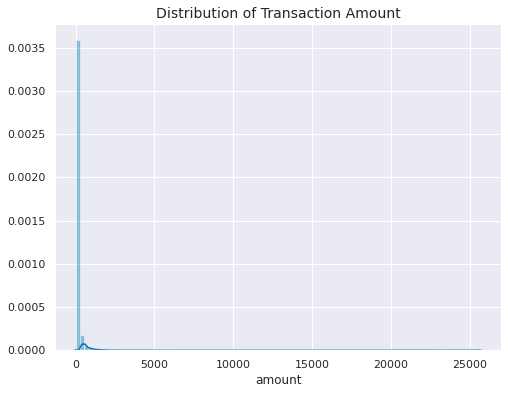

In [13]:
plt.figure(figsize=(8,6))
plt.title('Distribution of Transaction Amount', fontsize=14)
sns.distplot(df['amount'], bins=100)
plt.show()

**Highlights**

Most the transaction amount falls between 0 and about 3000 and we have some outliers for really big amount transactions and it may actually make sense to drop those outliers in our analysis if they are just a few points that are very extreme.

Most daily transactions are not extremely expensive, but it’s likely where most fraudulent transactions are occurring as well.

### Distribution of Amount for Fradulent & Genuine transactions

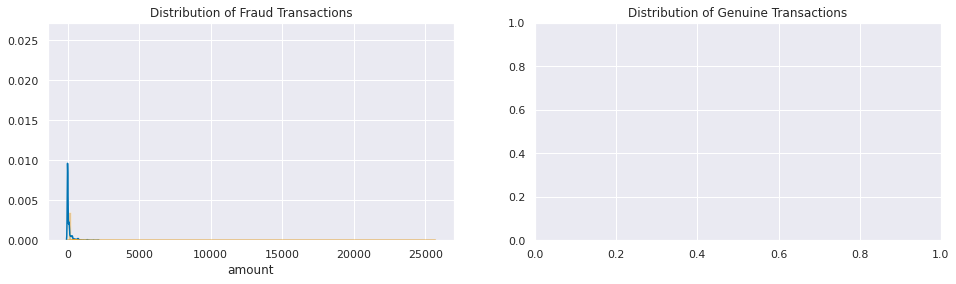

In [14]:
fig, axs = plt.subplots(ncols=2,figsize=(16,4))
sns.distplot(df[df['class'] == 1]['amount'], bins=100, ax=axs[0])
axs[0].set_title("Distribution of Fraud Transactions")

sns.distplot(df[df['class'] == 0]['amount'], bins=100, ax=axs[0])
axs[1].set_title("Distribution of Genuine Transactions")

plt.show()

**Highlights**

This graph shows that most of the fraud transaction amount is less than 500 dollars. This also shows that the fraud transaction is very high for an amount near to 0, let's find that amount.

In [15]:
print("Fraud Transaction distribution : \n",df[(df['class'] == 1)]['amount'].value_counts().head())
print("\n")
print("Maximum amount of fraud transaction - ",df[(df['class'] == 1)]['amount'].max())
print("Minimum amount of fraud transaction - ",df[(df['class'] == 1)]['amount'].min())

Fraud Transaction distribution : 
 1.00     113
0.00      27
99.99     27
0.76      17
0.77      10
Name: amount, dtype: int64


Maximum amount of fraud transaction -  2125.87
Minimum amount of fraud transaction -  0.0


**Highlights**

* There are 113 fraud transactions for just one dollor and 27 fraud transaction for $99.99. And higest fraud transaction amount was 2125.87 and lowest was just 0.00.
* There are 27 fraud transaction for zero amount. Zero Authorization is an account verification method for credit cards that is used to verify a cardholders information without charging the consumer. Instead, an amount of zero is charged on the card to store the credit card information in the form of a token and to determine whether the card is legitimate or not. After creating the token, is then possible to charge the consumer with a new transaction with either Tokenization or Recurring Payments

Ref : https://docs.multisafepay.com/tools/zero-authorization/what-is-zero-authorization/

In [16]:
print("Genuine Transaction distribution : \n",df[(df['class'] == 0)]['amount'].value_counts().head())
print("\n")
print("Maximum amount of Genuine transaction - ",df[(df['class'] == 0)]['amount'].max())
print("Minimum amount of Genuine transaction - ",df[(df['class'] == 0)]['amount'].min())

Genuine Transaction distribution : 
 1.00     13575
1.98      6044
0.89      4872
9.99      4746
15.00     3280
Name: amount, dtype: int64


Maximum amount of Genuine transaction -  25691.16
Minimum amount of Genuine transaction -  0.0


### Distribution of Amount w.r.t Class

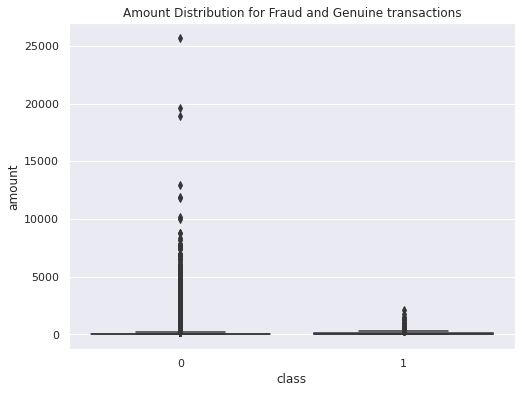

In [17]:
plt.figure(figsize=(8,6))
sns.boxplot(x='class', y='amount',data = df)
plt.title('Amount Distribution for Fraud and Genuine transactions')
plt.show()

**Highlights**

Most the transaction amount falls between 0 and about 3000 and we have some outliers for really big amount transactions and it may actually make sense to drop those outliers in our analysis if they are just a few points that are very extreme. Also, we should be conscious about that these **outliers should not be the fraudulent transaction**. Generally, fraudulent transactions of the very big amount and removing them from the data can make the predicting model bais. 

So we can essentially build a model that realistically predicts transaction as fraud without affected by outliers. It may not be really useful to actually have our model train on these extreme outliers.

## <a id='timedist'>Distribution of Time</a>

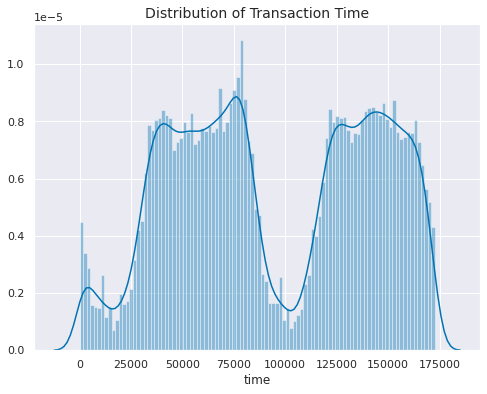

In [18]:
plt.figure(figsize=(8,6))
plt.title('Distribution of Transaction Time', fontsize=14)
sns.distplot(df['time'], bins=100)
plt.show()

**Highlights**

By seeing the graph, we can see there are two peaks in the graph and even there are some local peaks. We can think of these as the time of the day like the peak is the day time when most people do the transactions and the depth is the night time when most people just sleeps. We already know that data contains a credit card transaction for only two days, so there are two peaks for day time and one depth for one night time.

### Distribution of time w.r.t. transactions types

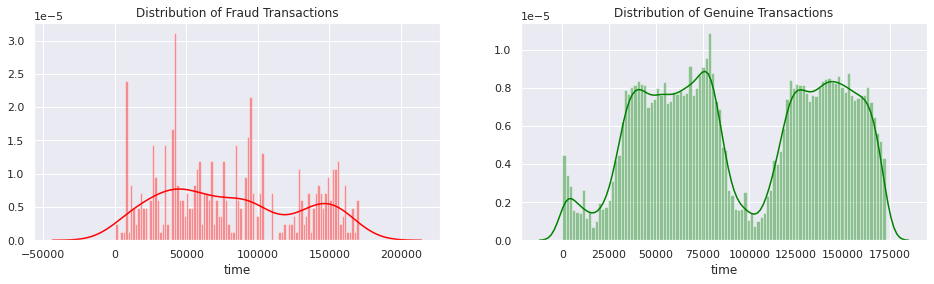

In [19]:
fig, axs = plt.subplots(ncols=2, figsize=(16,4))

sns.distplot(df[(df['class'] == 1)]['time'], bins=100, color='red', ax=axs[0])
axs[0].set_title("Distribution of Fraud Transactions")

sns.distplot(df[(df['class'] == 0)]['time'], bins=100, color='green', ax=axs[1])
axs[1].set_title("Distribution of Genuine Transactions")

plt.show()

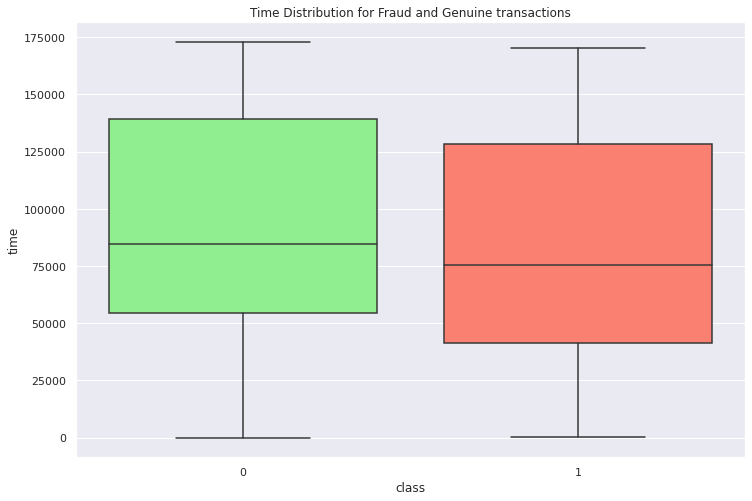

In [20]:
plt.figure(figsize=(12,8))
ax = sns.boxplot(x='class', y='time',data = df)

# Change the appearance of that box
ax.artists[0].set_facecolor('#90EE90')
ax.artists[1].set_facecolor('#FA8072')

plt.title('Time Distribution for Fraud and Genuine transactions')
plt.show()

### Distribution of transaction type w.r.t amount

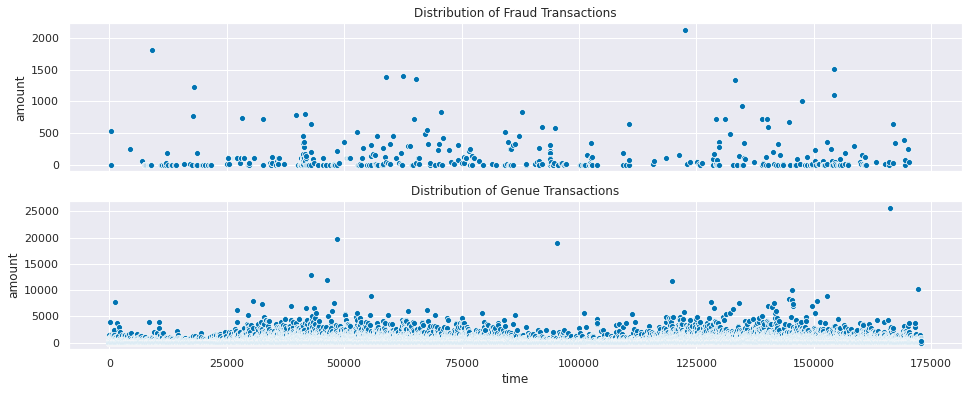

In [21]:
fig, axs = plt.subplots(nrows=2,sharex=True,figsize=(16,6))

sns.scatterplot(x='time',y='amount', data=df[df['class']==1], ax=axs[0])
axs[0].set_title("Distribution of Fraud Transactions")

sns.scatterplot(x='time',y='amount', data=df[df['class']==0], ax=axs[1])
axs[1].set_title("Distribution of Genue Transactions")

plt.show()

## <a id='catcont'>Categorical vs Continuous Features</a>

Finding unique values for each column to understand which column is categorical and which one is Continuous

In [22]:
# Finging unique values for each column
df[['time','amount','class']].nunique()

time      124592
amount     32767
class          2
dtype: int64

In [23]:
fig = px.scatter(df, x="time", y="amount", color="class", 
                 marginal_y="violin",marginal_x="box", trendline="ols", template="simple_white")
fig.show()

## <a id='corr'>Correlation Among Explanatory Variables</a>

Having **too many features** in a model is not always a good thing because it might cause overfitting and worse results when we want to predict values for a new dataset. Thus, **if a feature does not improve your model a lot, not adding it may be a better choice.**

Another important thing is **correlation. If there is a very high correlation between two features, keeping both of them is not a good idea most of the time not to cause overfitting.** However, this does not mean that you must remove one of the highly correlated features. 

Let's find out top 10 features which are highly correlated with a price.

In [24]:
df[['time','amount','class']].corr()['class'].sort_values(ascending=False).head(10)

class     1.000000
amount    0.005632
time     -0.012323
Name: class, dtype: float64

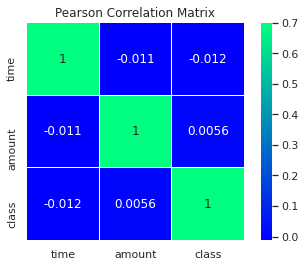

In [25]:
plt.title('Pearson Correlation Matrix')
sns.heatmap(df[['time', 'amount','class']].corr(),linewidths=0.25,vmax=0.7,square=True,cmap="winter",
            linecolor='w',annot=True);

**Highlights**

It looks like that no features are highly correlated with any other features.

## Lets check the data again after cleaning

In [26]:
df.shape

(284807, 31)

In [27]:
df['class'].value_counts(normalize=True)

0    0.998273
1    0.001727
Name: class, dtype: float64

# <a id='feateng'>Feature Engineering</a> 

## <a id='timefeateng'>Feature engineering on Time</a>

### Converting time from second to hour

In [28]:
# Converting time from second to hour
df['time'] = df['time'].apply(lambda sec : (sec/3600))

### Calculating hour of the day

In [29]:
# Calculating hour of the day
df['hour'] = df['time']%24   # 2 days of data
df['hour'] = df['hour'].apply(lambda x : math.floor(x))

### Calculating First and Second Day

In [30]:
# Calculating First and Second day
df['day'] = df['time']/24   # 2 days of data
df['day'] = df['day'].apply(lambda x : 1 if(x==0) else math.ceil(x))

In [31]:
df[['time','hour','day','amount','class']]

,time,hour,day,amount,class
0,0.000000,0,1,149.62,0
1,0.000000,0,1,2.69,0
2,0.000278,0,1,378.66,0
3,0.000278,0,1,123.50,0
4,0.000556,0,1,69.99,0
...,...,...,...,...,...
284802,47.996111,23,2,0.77,0
284803,47.996389,23,2,24.79,0
284804,47.996667,23,2,67.88,0
284805,47.996667,23,2,10.00,0


### Fraud and Genuine transaction Day wise

In [32]:
# calculating fraud transaction daywise
dayFrdTran = df[(df['class'] == 1)]['day'].value_counts()

# calculating genuine transaction daywise
dayGenuTran = df[(df['class'] == 0)]['day'].value_counts()

# calculating total transaction daywise
dayTran = df['day'].value_counts()

print("No of transaction Day wise:")
print(dayTran)

print("\n")

print("No of fraud transaction Day wise:")
print(dayFrdTran)

print("\n")

print("No of genuine transactions Day wise:")
print(dayGenuTran)

print("\n")

print("Percentage of fraud transactions Day wise:")
print((dayFrdTran/dayTran)*100)

No of transaction Day wise:
1    144787
2    140020
Name: day, dtype: int64


No of fraud transaction Day wise:
1    281
2    211
Name: day, dtype: int64


No of genuine transactions Day wise:
1    144506
2    139809
Name: day, dtype: int64


Percentage of fraud transactions Day wise:
1    0.194078
2    0.150693
Name: day, dtype: float64


**Highlights**

* Total number of transaction on Day 1 was 144787, out of which 281 was a fraud and 144506 was genuine. Fraud transaction was 0.19% of the total transaction on day 1.

* Total number of transaction on Day 2 was 140020, out of which 211 was a fraud and 139809 was genuine. Fraud transaction was 0.15% of the total transaction on day 2.

* Most of the transaction including the fraud transaction happened on day 1.

Let's see the above numbers in the graph.

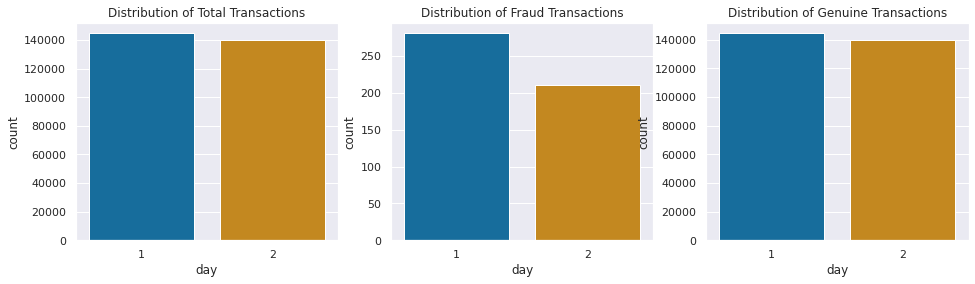

In [33]:
fig, axs = plt.subplots(ncols=3, figsize=(16,4))

sns.countplot(df['day'], ax=axs[0])
axs[0].set_title("Distribution of Total Transactions")

sns.countplot(df[(df['class'] == 1)]['day'], ax=axs[1])
axs[1].set_title("Distribution of Fraud Transactions")

sns.countplot(df[(df['class'] == 0)]['day'], ax=axs[2])
axs[2].set_title("Distribution of Genuine Transactions")

plt.show()

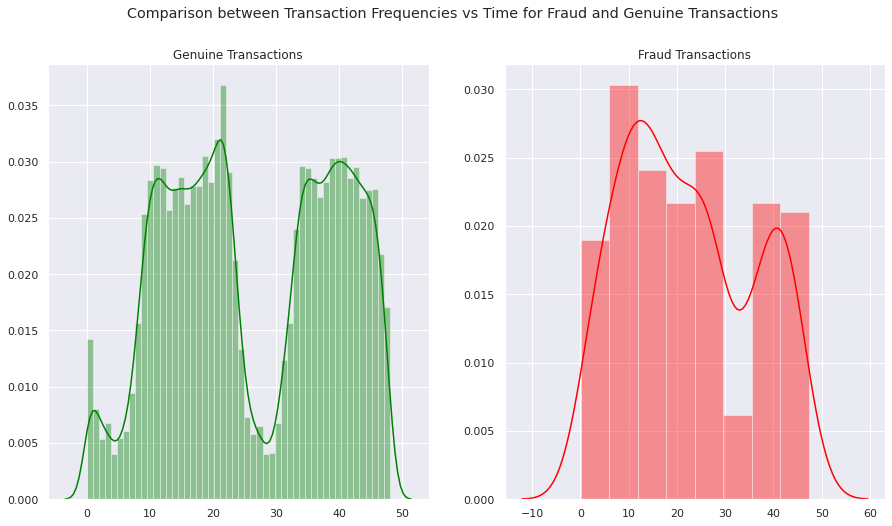

In [34]:
# Time plots 
fig , axs = plt.subplots(nrows = 1 , ncols = 2 , figsize = (15,8))

sns.distplot(df[df['class']==0]['time'].values , color = 'green' , ax = axs[0])
axs[0].set_title('Genuine Transactions')

sns.distplot(df[df['class']==1]['time'].values , color = 'red' ,ax = axs[1])
axs[1].set_title('Fraud Transactions')

fig.suptitle('Comparison between Transaction Frequencies vs Time for Fraud and Genuine Transactions')
plt.show()

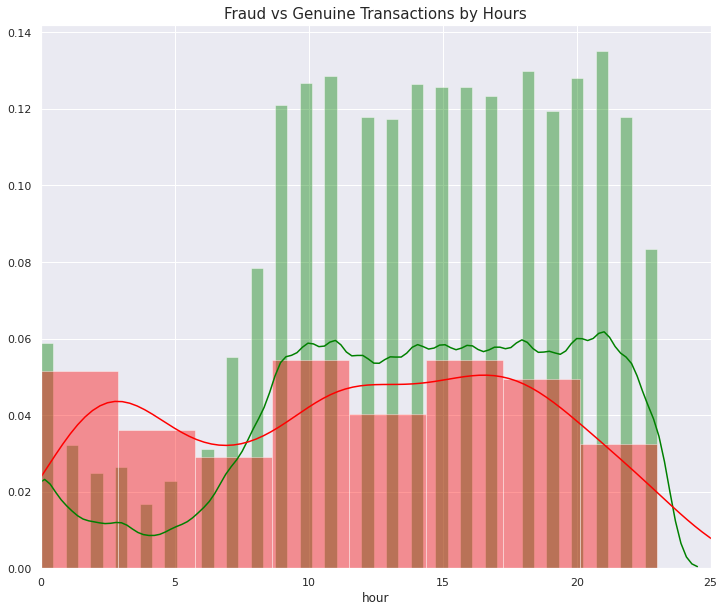

In [35]:
# Let's see if we find any particular pattern between time ( in hours ) and Fraud vs Genuine Transactions

plt.figure(figsize=(12,10))

sns.distplot(df[df['class'] == 0]["hour"], color='green') # Genuine - green
sns.distplot(df[df['class'] == 1]["hour"], color='red') # Fraudulent - Red

plt.title('Fraud vs Genuine Transactions by Hours', fontsize=15)
plt.xlim([0,25])
plt.show()

**Highlights**

**Above graph shows that most of the Fraud transactions are happening at night time (0 to 7 hours) when most of the people are sleeping and Genuine transaction are happening during day time (9 to 21 hours).**

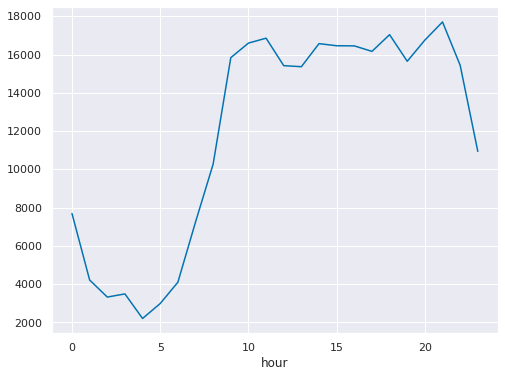

In [36]:
plt.figure(figsize=(8,6))
df[['time','hour','day','amount','class']].groupby('hour').count()['class'].plot()
plt.show()

### Visualising Data for detecting any particular Pattern or Anomaly using Histogram Plots

Finally visulaising all columns once and for all to observe any abnormality

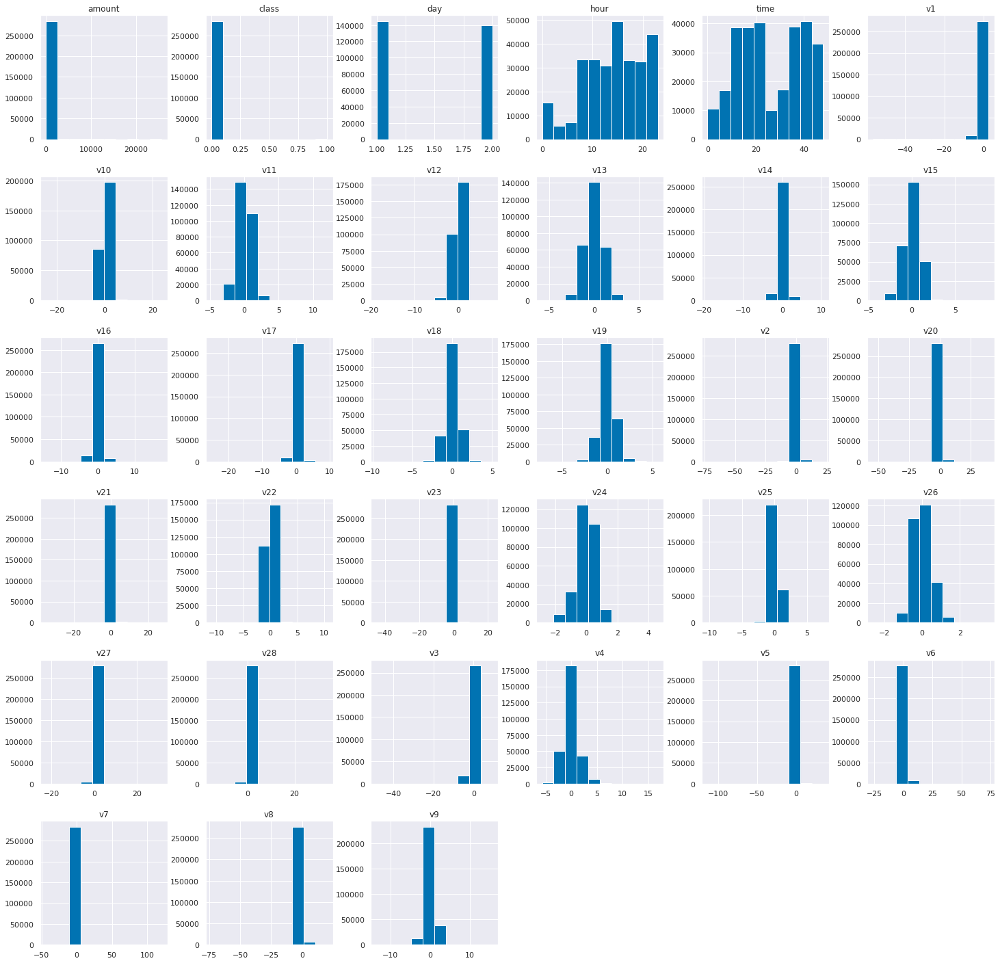

In [37]:
df.hist(figsize = (25,25))
plt.show()

## Reset the index

In [38]:
df.reset_index(inplace = True , drop = True)

# <a id='scaleamount'>Scale Amount Feature</a>

* It is a good idea to scale the data so that the column(feature) with lesser significance might not end up dominating the objective function due to its larger range. like a column like age has a range between 0 to 80, but a column like a salary has ranged from thousands to lakhs, hence, salary column will dominate to predict the outcome even if it may not be important.
* In addition, features having different unit should also be scaled thus providing each feature equal initial weightage. Like Age in years and Sales in Dollars must be brought down to a common scale before feeding it to the ML algorithm
* This will result in a better prediction model.



**PCA Transformation**: The description of the data says that all the features went through a PCA transformation (Dimensionality Reduction technique) except for time and amount.

**Scaling**: Keep in mind that in order to implement a PCA transformation features need to be previously scaled.

## <a id='scalelog'>1. Scale amount by Log</a>

**Scaling using the log**: There are two main reasons to use logarithmic scales in charts and graphs. 
* The first is to respond to skewness towards large values; i.e., cases in which one or a few points are much larger than the bulk of the data. 
* The second is to show per cent change or multiplicative factors. 

In [39]:
# Scale amount by log
df['amount_log'] = np.log(df.amount + 0.01)

## <a id='scalestand'>2. Scale  amount by Standardization</a>

Standardization is another scaling technique where the values are centered around the mean with a unit standard deviation. This means that the mean of the attribute becomes zero and the resultant distribution has a unit standard deviation.

$$ z = \frac{x_i - \mu}{\sigma} $$

In [40]:
from sklearn.preprocessing import StandardScaler # importing a class from a module of a library

ss = StandardScaler() # object of the class StandardScaler ()
df['amount_scaled'] = ss.fit_transform(df['amount'].values.reshape(-1,1))

## <a id='scalenorm'>3. Scale  amount by Normalization</a>

Normalization is a scaling technique in which values are shifted and rescaled so that they end up ranging between 0 and 1. It is also known as Min-Max scaling.

$$ x_{norm} = \frac{x_i - x_{min}}{x_{max}-x_{min}} $$

In [41]:
from sklearn.preprocessing import MinMaxScaler

mm = MinMaxScaler() # object of the class StandardScaler ()
df['amount_minmax'] = mm.fit_transform(df['amount'].values.reshape(-1,1))

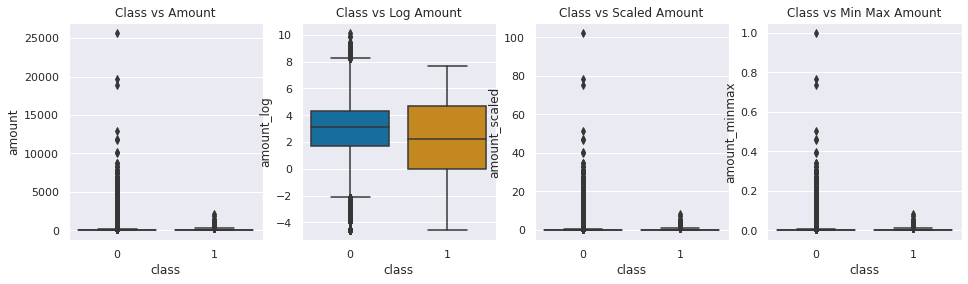

In [42]:
#Feature engineering to a better visualization of the values

# Let's explore the Amount by Class and see the distribuition of Amount transactions
fig , axs = plt.subplots(nrows = 1 , ncols = 4 , figsize = (16,4))

sns.boxplot(x ="class",y="amount",data=df, ax = axs[0])
axs[0].set_title("Class vs Amount")

sns.boxplot(x ="class",y="amount_log",data=df, ax = axs[1])
axs[1].set_title("Class vs Log Amount")

sns.boxplot(x ="class",y="amount_scaled",data=df, ax = axs[2])
axs[2].set_title("Class vs Scaled Amount")

sns.boxplot(x ="class",y="amount_minmax",data=df, ax = axs[3])
axs[3].set_title("Class vs Min Max Amount")

# fig.suptitle('Amount by Class', fontsize=20)
plt.show()

**Hightlights**

* We can see a slight difference in the log amount of our two Classes. 
* The IQR of fraudulent transactions are higher than normal transactions, but normal transactions have the highest values.
* **By seeing the above three graphs, I think scaling the amount by log will best suit for our model.**

In [43]:
df[['time','hour','day','amount','amount_log','amount_scaled','amount_minmax','class']]

,time,hour,day,amount,amount_log,amount_scaled,amount_minmax,class
0,0.000000,0,1,149.62,5.008166,0.244964,0.005824,0
1,0.000000,0,1,2.69,0.993252,-0.342475,0.000105,0
2,0.000278,0,1,378.66,5.936665,1.160686,0.014739,0
3,0.000278,0,1,123.50,4.816322,0.140534,0.004807,0
4,0.000556,0,1,69.99,4.248495,-0.073403,0.002724,0
...,...,...,...,...,...,...,...,...
284802,47.996111,23,2,0.77,-0.248461,-0.350151,0.000030,0
284803,47.996389,23,2,24.79,3.210844,-0.254117,0.000965,0
284804,47.996667,23,2,67.88,4.217889,-0.081839,0.002642,0
284805,47.996667,23,2,10.00,2.303585,-0.313249,0.000389,0


# <a id='pickle'>Saving preprossed data as serialized files</a>
* To deploy the predictive models built we save them along with the required data files as serialized file objects
* We save cleaned and processed input data, tuned predictive models as files so that they can later be re-used/shared

In [44]:
CreditCardFraudDataCleaned = df

# Saving the Python objects as serialized files can be done using pickle library
# Here let us save the Final Data set after all the transformations as a file
with open('CreditCardFraudDataCleaned.pkl', 'wb') as fileWriteStream:
    pickle.dump(CreditCardFraudDataCleaned, fileWriteStream)
    # Don't forget to close the filestream!
    fileWriteStream.close()
    
print('pickle file is saved at Location:',os.getcwd())

pickle file is saved at Location: /kaggle/working


### Load preprocessed data

In [45]:
# Reading a Pickle file
with open('CreditCardFraudDataCleaned.pkl', 'rb') as fileReadStream:
    CreditCardFraudDataFromPickle = pickle.load(fileReadStream)
    # Don't forget to close the filestream!
    fileReadStream.close()
    
# Checking the data read from pickle file. It is exactly same as the DiamondPricesData
df = CreditCardFraudDataFromPickle
df.head()

,time,v1,v2,v3,v4,v5,v6,v7,v8,v9,v10,v11,v12,v13,v14,v15,v16,v17,v18,v19,v20,v21,v22,v23,v24,v25,v26,v27,v28,amount,class,hour,day,amount_log,amount_scaled,amount_minmax
0,0.000000,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0,0,1,5.008166,0.244964,0.005824
1,0.000000,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,1.612727,1.065235,0.489095,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0,0,1,0.993252,-0.342475,0.000105
2,0.000278,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,0.624501,0.066084,0.717293,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0,0,1,5.936665,1.160686,0.014739
3,0.000278,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,-0.226487,0.178228,0.507757,-0.287924,-0.631418,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0,0,1,4.816322,0.140534,0.004807
4,0.000556,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,-0.822843,0.538196,1.345852,-1.119670,0.175121,-0.451449,-0.237033,-0.038195,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0,0,1,4.248495,-0.073403,0.002724


In [46]:
df.shape

(284807, 36)

In [47]:
df.head()

,time,v1,v2,v3,v4,v5,v6,v7,v8,v9,v10,v11,v12,v13,v14,v15,v16,v17,v18,v19,v20,v21,v22,v23,v24,v25,v26,v27,v28,amount,class,hour,day,amount_log,amount_scaled,amount_minmax
0,0.000000,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0,0,1,5.008166,0.244964,0.005824
1,0.000000,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,1.612727,1.065235,0.489095,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0,0,1,0.993252,-0.342475,0.000105
2,0.000278,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,0.624501,0.066084,0.717293,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0,0,1,5.936665,1.160686,0.014739
3,0.000278,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,-0.226487,0.178228,0.507757,-0.287924,-0.631418,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0,0,1,4.816322,0.140534,0.004807
4,0.000556,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,-0.822843,0.538196,1.345852,-1.119670,0.175121,-0.451449,-0.237033,-0.038195,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0,0,1,4.248495,-0.073403,0.002724


# <a id='splitdata'>Splitting data into Training and Testing samples</a>

We don't use the full data for creating the model. Some data is randomly selected and kept aside for checking how good the model is. This is known as Testing Data and the remaining data is called Training data on which the model is built. Typically 70% of data is used as training data and the rest 30% is used as testing data.

In [48]:
df.columns

Index(['time', 'v1', 'v2', 'v3', 'v4', 'v5', 'v6', 'v7', 'v8', 'v9', 'v10',
       'v11', 'v12', 'v13', 'v14', 'v15', 'v16', 'v17', 'v18', 'v19', 'v20',
       'v21', 'v22', 'v23', 'v24', 'v25', 'v26', 'v27', 'v28', 'amount',
       'class', 'hour', 'day', 'amount_log', 'amount_scaled', 'amount_minmax'],
      dtype='object')

**Highlights**

* We have created few new features like an hour, day, scaled amount. However, these are just for visualization purpose only, not for building the model.

In [49]:
# Separate Target Variable and Predictor Variables
# Here I am keeping the log amount and dropping the amount and scaled amount columns.
X = df.drop(['time','class','hour','day','amount','amount_minmax','amount_scaled'],axis=1)
y = df['class']

In [50]:
X

,v1,v2,v3,v4,v5,v6,v7,v8,v9,v10,v11,v12,v13,v14,v15,v16,v17,v18,v19,v20,v21,v22,v23,v24,v25,v26,v27,v28,amount_log
0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,5.008166
1,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,1.612727,1.065235,0.489095,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,0.993252
2,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,0.624501,0.066084,0.717293,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,5.936665
3,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,-0.226487,0.178228,0.507757,-0.287924,-0.631418,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,4.816322
4,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,-0.822843,0.538196,1.345852,-1.119670,0.175121,-0.451449,-0.237033,-0.038195,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,4.248495
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284802,-11.881118,10.071785,-9.834783,-2.066656,-5.364473,-2.606837,-4.918215,7.305334,1.914428,4.356170,-1.593105,2.711941,-0.689256,4.626942,-0.924459,1.107641,1.991691,0.510632,-0.682920,1.475829,0.213454,0.111864,1.014480,-0.509348,1.436807,0.250034,0.943651,0.823731,-0.248461
284803,-0.732789,-0.055080,2.035030,-0.738589,0.868229,1.058415,0.024330,0.294869,0.584800,-0.975926,-0.150189,0.915802,1.214756,-0.675143,1.164931,-0.711757,-0.025693,-1.221179,-1.545556,0.059616,0.214205,0.924384,0.012463,-1.016226,-0.606624,-0.395255,0.068472,-0.053527,3.210844
284804,1.919565,-0.301254,-3.249640,-0.557828,2.630515,3.031260,-0.296827,0.708417,0.432454,-0.484782,0.411614,0.063119,-0.183699,-0.510602,1.329284,0.140716,0.313502,0.395652,-0.577252,0.001396,0.232045,0.578229,-0.037501,0.640134,0.265745,-0.087371,0.004455,-0.026561,4.217889
284805,-0.240440,0.530483,0.702510,0.689799,-0.377961,0.623708,-0.686180,0.679145,0.392087,-0.399126,-1.933849,-0.962886,-1.042082,0.449624,1.962563,-0.608577,0.509928,1.113981,2.897849,0.127434,0.265245,0.800049,-0.163298,0.123205,-0.569159,0.546668,0.108821,0.104533,2.303585


In [51]:
# Load the library for splitting the data
from sklearn.model_selection import train_test_split

In [52]:
# Split the data into training and testing set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, shuffle=True, random_state=101)

In [53]:
# Quick sanity check with the shapes of Training and testing datasets
print("X_train - ",X_train.shape)
print("y_train - ",y_train.shape)
print("X_test - ",X_test.shape)
print("y_test - ",y_test.shape)

X_train -  (199364, 29)
y_train -  (199364,)
X_test -  (85443, 29)
y_test -  (85443,)


# <a id='modelbaseline'>Baseline for models</a>

We will train four types of classifiers and decide which classifier will be more effective in detecting **fraud transactions**.

#### Let's Discuss Next Steps - 

1  __Classification Models__

- Logistic Regression
- Decision Trees
- Random Forest
- Naive Bayes Classifier 

2  __Class Imbalance Solutions__

- Under Sampling
- Over Sampling
- SMOTE
- ADASYN

3  __Metrics__

- Accuracy Score
- Confusion Matrix
- Precision Score
- Recall Score
- ROC_AUC
- F1 Score

# <a id='modelbuild'>Model Building</a>

##### We are aware that our dataset is highly imbalanced, however, we check the performance of imbalance dataset first and later we implement some techniques to balance the dataset and again check the performance of balanced dataset. Finally, we will compare each regression models performance.

# <a id='logreg'>1. Logistic Regression</a>

## <a id='logregim'>1.1 Logistic Regression with imbalanced data</a>

In [54]:
from sklearn.linear_model import LogisticRegression # Importing Classifier Step

In [55]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, shuffle=True, random_state=0) 


logreg = LogisticRegression()
logreg.fit(X_train, y_train) 

LogisticRegression()

### Predict from Test set

In [56]:
y_pred = logreg.predict(X_test)

### <a id='modevel'>Model Evolution</a>

In [57]:
from sklearn import metrics

In [58]:
# https://en.wikipedia.org/wiki/Precision_and_recall
print(metrics.classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85296
           1       0.89      0.63      0.74       147

    accuracy                           1.00     85443
   macro avg       0.95      0.81      0.87     85443
weighted avg       1.00      1.00      1.00     85443



In [59]:
print('Accuracy :{0:0.5f}'.format(metrics.accuracy_score(y_pred , y_test))) 
print('AUC : {0:0.5f}'.format(metrics.roc_auc_score(y_test , y_pred)))
print('Precision : {0:0.5f}'.format(metrics.precision_score(y_test , y_pred)))
print('Recall : {0:0.5f}'.format(metrics.recall_score(y_test , y_pred)))
print('F1 : {0:0.5f}'.format(metrics.f1_score(y_test , y_pred)))
# print('Confusion Matrix : \n', cnf_matrix)
print("\n")

Accuracy :0.99923
AUC : 0.81286
Precision : 0.89320
Recall : 0.62585
F1 : 0.73600




In [60]:
# Predicted values counts for fraud and genuine of test dataset
pd.Series(y_pred).value_counts()

0    85340
1      103
dtype: int64

**Highlights**

Our model predicted 103 transactions as fraud and 85340 transactions as genuine from the test dataset.

In [61]:
# Actual values counts for fraud and genuine of test dataset
pd.Series(y_test).value_counts()

0    85296
1      147
Name: class, dtype: int64

**There are originally 147 fraud transactions and our model predicted only 103 fraud transaction. So the accuracy of our model should be ${103}\over{147}$, right?**

In [62]:
103/147

0.7006802721088435

So 71.533% should be our accuracy.

**However, this not the case. Actually there are originally 147 fraud transactions and 85296 genuine transactions in the test dataset. However, our model predicted only 103 fraud transaction. Also, it should be kept in mind that these 103 predicted fraud transaction may not be identified correctly. It means that these predicted 103 fraud transactions are NOT only from 147 originally fraud transaction, but they may also be from genuine transactions as well.**

We will see our real accuracy in below cells.

### <a id='modevelmatrix'>Model Evolution Matrix</a>

Every problem is different and derives a different set of values for a particular business use case , thus every model must be evaluated differently.

**Let's get to know the terminology and Structure first**

A confusion matrix is defined into four parts : __{ TRUE , FALSE } (Actual) ,{POSITIVE , NEGATIVE} (Predicted)__
Positive and Negative is what you predict , True and False is what you are told

Which brings us to 4 relations : True Positive , True Negative , False Positive , False Negative <br>
__P__ redicted - __R__ ows and __A__ ctual as __C__ olumns <br>

<img src = 'https://github.com/dktalaicha/Kaggle/blob/master/CreditCardFraudDetection/images/final_cnf.png?raw=true'>


### Accuracy , Precision and Recall

##### __Accuracy__ : The most used and classic classification metric : Suited for binary classification problems.

$$  \text{Accuracy} = \frac{( TP + TN ) }{ (TP + TN + FP + FN )}$$

Basically Rightly predicted results amongst all the results , used when the classes are balanced

##### __Precision__ : What proportion of predicted positives are truly positive ? Used when we need to predict the positive thoroughly, sure about it !

$$ \text{Precision} = \frac{( TP )}{( TP + FP )} $$

##### __Sensitivity or Recall__ : What proportion of actual positives is correctly classified ? choice when we want to capture as many positives as possible

$$ \text{Recall} = \frac{(TP)}{( TP + FN )} $$

##### __F1 Score__ : Harmonic mean of Precision and Recall. It basically maintains a balance between the precision and recall for your classifier

$$ F1 = \frac{2 * (\text{ precision } * \text{ recall })}{(\text{ precision } + \text{ recall } )} $$

<img src='https://i.imgur.com/IYuqqic.gif' />

**Precision as the name says, says how precise (how sure) is our model in detecting fraud transactions while recall is the amount of fraud cases our model is able to detect.**


**In reference of our case**:

Recall (True Positive Rate): % of all fraudulent transactions cases captured.

Precision: Out of all items labeled as fraud, what percentage of them is actually fraud?

Accuracy: How correct the model is (misleading for fraud/imbalanced data)

F1 score: combination of recall and precision into one metric. F1 score is the weighted average of precision and recall, taking BOTH false positives and false negatives into account. Usually much more useful than accuracy, especially with uneven classes.

### Confusion Matrix

In [63]:
cnf_matrix = metrics.confusion_matrix(y_test,y_pred)
cnf_matrix

array([[85285,    11],
       [   55,    92]])

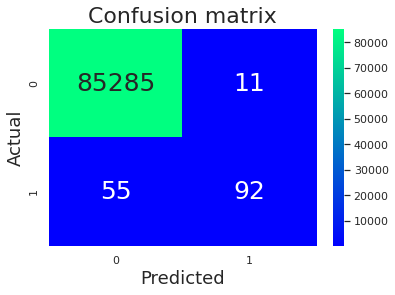

In [64]:
# Heatmap for Confusion Matrix
p = sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, annot_kws={"size": 25}, cmap="winter" ,fmt='g')

plt.title('Confusion matrix', y=1.1, fontsize = 22)
plt.ylabel('Actual',fontsize = 18)
plt.xlabel('Predicted',fontsize = 18)

# ax.xaxis.set_ticklabels(['Genuine', 'Fraud']); 
# ax.yaxis.set_ticklabels(['Genuine', 'Fraud']);

plt.show()

**There are 84 transaction recognised as True Postive, means they are orignally fraud transactions and our model precited them as fraud.**

**True Negative** - 85285 (truely saying negative - genuine transaction correctly identified as genuine)

**True Postive** - 92 (truely saying positive - fraud transaction correctly identified as fraud)

**False Negative** - 55 ( falsely saying negative - fraud transaction incorrectly identified as genuine)

**False Positive** - 11 ( falsely saying positive - genuine transaction incorrectly identified as fraud)

#### We already know that we have 147 fraud transaction in our test dataset, but our model predicted only 92 fraud transaction. So the real accuracy of our model is ${92}\over{147}$

In [65]:
92/147

0.6258503401360545

So, **62.59%** is the real accuracy of our model, which is nothing but the **Recall Score**. So we have the emphasis on Recall score and F1 score to measure the performance of our model, not the accuracy.

### <a id='roccurve'>Receiver Operating Characteristics (ROC)</a>

The ROC is a performance measurement for classification problems at various thresholds. It is essentially a probability curve, and the higher the Area Under the Curve (AUC) score the better the model is at predicting fraudulent/non-fraudulent transactions.

It is an evaluation metric that helps identify the strength of the model to **distinguish between two outcomes**. It defines if a model can create a clear boundary between the postive and the negative class. 

<div style='width:100%;'>
   <div style='width:30%; float:left;'> <img  src ='https://i.imgur.com/fzBGUDy.jpg' /> </div>
   <div style=''> <img  src ='https://i.imgur.com/hZQiNCn.png' /> </div>
</div>


Let's talk about some definitions first: 

##### __Sensitivity__ or __Recall__

The sensitivity of a model is defined by the proportion of actual positives that are classified as Positives , i.e = TP / ( TP + FN )

$$ \text{Recall or Sensitivity} = \frac{(TP)}{( TP + FN )} $$

<img src = "https://github.com/dktalaicha/Kaggle/blob/master/CreditCardFraudDetection/images/sens.png?raw=true">

##### __Specificity__

The specificity of a model is defined by the proportion of actual negatives that are classified as Negatives , i.e = TN / ( TN + FP )

$$ \text{Specificity} = \frac{(TN)}{( TN + FP )} $$

<img src = "https://github.com/dktalaicha/Kaggle/blob/master/CreditCardFraudDetection/images/spec.png?raw=true">

As we can see that both are independent of each other and lie in teo different quadrants , we can understand that they are inversely related to each other. Thus as Sensitivity goes up , Specificity goes down and vice versa.

### ROC CURVE

It is a plot between Sesitivity and ( 1 - Specificity ) , which intuitively is a plot between True Positive Rate and False Positive Rate. 
It depicts if a model can clearly identify each class or not

Higher the area under the curve , better the model and it's ability to seperate the positive and negative class.

<img src = "https://github.com/dktalaicha/Kaggle/blob/master/CreditCardFraudDetection/images/tpfpfntn.jpeg?raw=true">
<img src = "https://github.com/dktalaicha/Kaggle/blob/master/CreditCardFraudDetection/images/auc.png?raw=true">
<img src = "https://github.com/dktalaicha/Kaggle/blob/master/CreditCardFraudDetection/images/auc2.png?raw=true">

<img src='https://i.imgur.com/GRuZpez.gif'>

In [66]:
metrics.roc_auc_score(y_test , y_pred) 

0.8128606887324429

In [67]:
y_pred_proba = logreg.predict_proba(X_test)
y_pred_proba

array([[9.99449741e-01, 5.50258517e-04],
       [9.99633653e-01, 3.66346923e-04],
       [9.99508178e-01, 4.91821895e-04],
       ...,
       [9.99395206e-01, 6.04794303e-04],
       [9.99803877e-01, 1.96122683e-04],
       [9.99022139e-01, 9.77860650e-04]])

AUC -  0.8128606887324429 



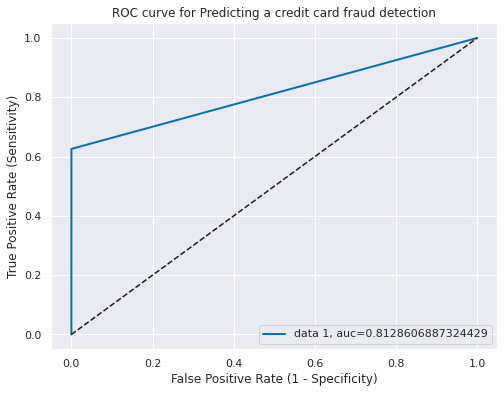

In [68]:
# plot ROC Curve

plt.figure(figsize=(8,6))

fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred)

auc = metrics.roc_auc_score(y_test, y_pred)
print("AUC - ",auc,"\n")

plt.plot(fpr,tpr,linewidth=2, label="data 1, auc="+str(auc))
plt.legend(loc=4)

plt.plot([0,1], [0,1], 'k--' )

plt.rcParams['font.size'] = 12
plt.title('ROC curve for Predicting a credit card fraud detection')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')

plt.show()

# <a id='classimbalance'>Class Imbalance</a>

Imbalanced data typically refers to a problem with classification problems where the classes are not represented equally.  If one applies classifiers on the dataset, they are likely to predict everything as the majority class. This was often regarded as a problem in learning from highly imbalanced datasets.

<img src='https://i.imgur.com/uqh1peJ.gif' />


Let's Fix the class Imbalance and apply some sampling techniques.


Ref : https://machinelearningmastery.com/tactics-to-combat-imbalanced-classes-in-your-machine-learning-dataset/

## <a id='undovrsamp'>Under Sampling and Over Sampling</a>

Oversampling and undersampling in data analysis are techniques used to adjust the class distribution of a data set. 

* Random oversampling duplicates examples from the minority class in the training dataset and can result in overfitting for some models.

* Random undersampling deletes examples from the majority class and can result in losing information invaluable to a model.

<img src = 'https://github.com/dktalaicha/Kaggle/blob/master/CreditCardFraudDetection/images/under_over_sampling.jpg?raw=true'>

## <a id='smote'>Synthetic Minority OverSampling Technique (SMOTE)</a>

In this technique, instead of simply duplicating data from the minority class, we synthesize new data from the minority class. This is a type of data augmentation for tabular data can be very effective. This approach to synthesizing new data is called the Synthetic Minority Oversampling TEchnique, or SMOTE for short. 

<img src='https://github.com/dktalaicha/Kaggle/blob/master/CreditCardFraudDetection/images/smote.png?raw=true'>

## <a id='adasyn'>Adaptive Synthetic Sampling Method for Imbalanced Data (ADASYN)</a>

ADASYN (Adaptive Synthetic) is an algorithm that generates synthetic data, and its greatest advantages are not copying the same minority data, and generating more data for “harder to learn” examples.

Ref : https://medium.com/@ruinian/an-introduction-to-adasyn-with-code-1383a5ece7aa

## Import imbalace technique algorithims

In [69]:
# Import imbalace technique algorithims
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score, accuracy_score, classification_report
from imblearn.over_sampling import SMOTE, ADASYN
from imblearn.under_sampling import RandomUnderSampler

## <a id='logregundsamp'>1.2.Logistic Regression with Random Undersampling technique</a>

In [70]:
from collections import Counter # counter takes values returns value_counts dictionary
from sklearn.datasets import make_classification

In [71]:
print('Original dataset shape %s' % Counter(y))

rus = RandomUnderSampler(random_state=42)
X_res, y_res = rus.fit_resample(X, y)

print('Resampled dataset shape %s' % Counter(y_res))

Original dataset shape Counter({0: 284315, 1: 492})
Resampled dataset shape Counter({0: 492, 1: 492})


In [72]:
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size=0.3, shuffle=True, random_state=0)

# Undersampling with Logistic Regression
logreg = LogisticRegression()
logreg.fit(X_train, y_train)

y_pred = logreg.predict(X_test)

In [73]:
print('Accuracy :{0:0.5f}'.format(metrics.accuracy_score(y_pred , y_test))) 
print('AUC : {0:0.5f}'.format(metrics.roc_auc_score(y_test , y_pred)))
print('Precision : {0:0.5f}'.format(metrics.precision_score(y_test , y_pred)))
print('Recall : {0:0.5f}'.format(metrics.recall_score(y_test , y_pred)))
print('F1 : {0:0.5f}'.format(metrics.f1_score(y_test , y_pred)))

Accuracy :0.94595
AUC : 0.94608
Precision : 0.96503
Recall : 0.92617
F1 : 0.94521


AUC -  0.9460804456010592 



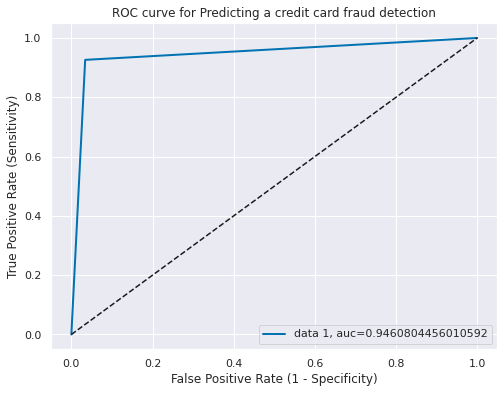

In [74]:
# plot ROC Curve

plt.figure(figsize=(8,6))

fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred)

auc = metrics.roc_auc_score(y_test, y_pred)
print("AUC - ",auc,"\n")

plt.plot(fpr,tpr,linewidth=2, label="data 1, auc="+str(auc))
plt.legend(loc=4)

plt.plot([0,1], [0,1], 'k--' )

plt.rcParams['font.size'] = 12
plt.title('ROC curve for Predicting a credit card fraud detection')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')

plt.show()

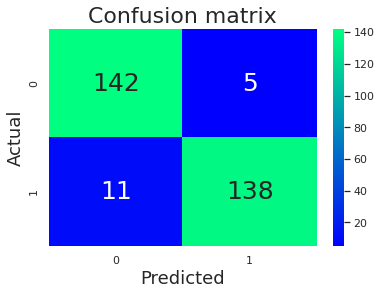

In [75]:
# Heatmap for Confusion Matrix

cnf_matrix = metrics.confusion_matrix(y_test , y_pred)
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, annot_kws={"size": 25}, cmap="winter" ,fmt='g')

plt.title('Confusion matrix', y=1.1, fontsize = 22)
plt.xlabel('Predicted',fontsize = 18)
plt.ylabel('Actual',fontsize = 18)

# ax.xaxis.set_ticklabels(['Genuine', 'Fraud']); 
# ax.yaxis.set_ticklabels(['Genuine', 'Fraud']);

plt.show()

## <a id='logregovrsamp'>1.3.Logistic Regression with Random Oversampling technique</a>

In [76]:
from imblearn.over_sampling import RandomOverSampler

In [77]:
print('Original dataset shape %s' % Counter(y))
random_state = 42

ros = RandomOverSampler(random_state=random_state)
X_res, y_res = ros.fit_resample(X, y)

print('Resampled dataset shape %s' % Counter(y_res))

Original dataset shape Counter({0: 284315, 1: 492})
Resampled dataset shape Counter({0: 284315, 1: 284315})


In [78]:
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size=0.3, shuffle=True, random_state=0)

# Oversampling with Logistic Regression
logreg = LogisticRegression()
logreg.fit(X_train, y_train)

y_pred = logreg.predict(X_test)

In [79]:
print('Accuracy :{0:0.5f}'.format(metrics.accuracy_score(y_test , y_pred))) 
print('AUC : {0:0.5f}'.format(metrics.roc_auc_score(y_test , y_pred)))
print('Precision : {0:0.5f}'.format(metrics.precision_score(y_test , y_pred)))
print('Recall : {0:0.5f}'.format(metrics.recall_score(y_test , y_pred)))
print('F1 : {0:0.5f}'.format(metrics.f1_score(y_test , y_pred)))

Accuracy :0.94523
AUC : 0.94527
Precision : 0.97444
Recall : 0.91461
F1 : 0.94358


AUC -  0.9452749803056485 



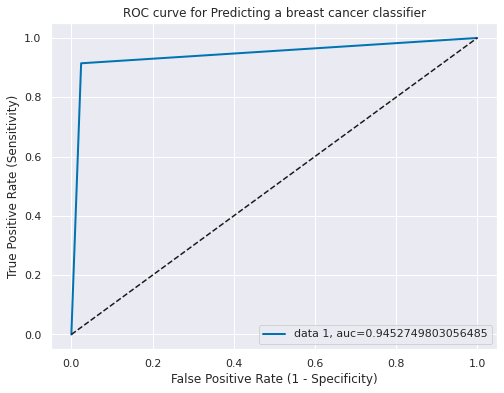

In [80]:
# plot ROC Curve

plt.figure(figsize=(8,6))

fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred)

auc = metrics.roc_auc_score(y_test, y_pred)
print("AUC - ",auc,"\n")

plt.plot(fpr,tpr,linewidth=2, label="data 1, auc="+str(auc))
plt.legend(loc=4)

plt.plot([0,1], [0,1], 'k--' )

plt.rcParams['font.size'] = 12
plt.title('ROC curve for Predicting a breast cancer classifier')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')

plt.show()

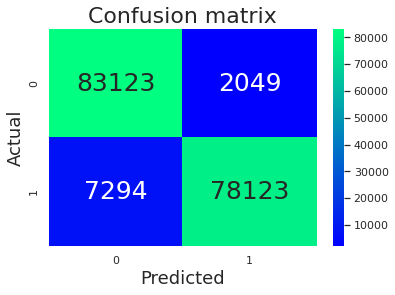

In [81]:
# Heatmap for Confusion Matrix

cnf_matrix = metrics.confusion_matrix(y_test , y_pred)
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, annot_kws={"size": 25}, cmap="winter" ,fmt='g')

plt.title('Confusion matrix', y=1.1, fontsize = 22)
plt.xlabel('Predicted',fontsize = 18)
plt.ylabel('Actual',fontsize = 18)

# ax.xaxis.set_ticklabels(['Genuine', 'Fraud']); 
# ax.yaxis.set_ticklabels(['Genuine', 'Fraud']);

plt.show()

## <a id='logregsomote'>1.4 Logistic Regression with SMOTE data</a>

In [82]:
from imblearn.over_sampling import SMOTE, ADASYN

In [83]:
print('Original dataset shape %s' % Counter(y))

smote = SMOTE(random_state=42)
X_res, y_res = smote.fit_resample(X, y)

print('Resampled dataset shape %s' % Counter(y_res))

Original dataset shape Counter({0: 284315, 1: 492})
Resampled dataset shape Counter({0: 284315, 1: 284315})


In [84]:
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size=0.3, shuffle=True, random_state=0)

# SMOTE Sampling with Logistic Regression
logreg = LogisticRegression(max_iter=1000)
logreg.fit(X_train, y_train)

y_pred = logreg.predict(X_test)

In [85]:
print('Accuracy :{0:0.5f}'.format(metrics.accuracy_score(y_test , y_pred))) 
print('AUC : {0:0.5f}'.format(metrics.roc_auc_score(y_test , y_pred)))
print('Precision : {0:0.5f}'.format(metrics.precision_score(y_test , y_pred)))
print('Recall : {0:0.5f}'.format(metrics.recall_score(y_test , y_pred)))
print('F1 : {0:0.5f}'.format(metrics.f1_score(y_test , y_pred)))

Accuracy :0.94511
AUC : 0.94516
Precision : 0.97330
Recall : 0.91550
F1 : 0.94352


AUC -  0.9451562911273197 



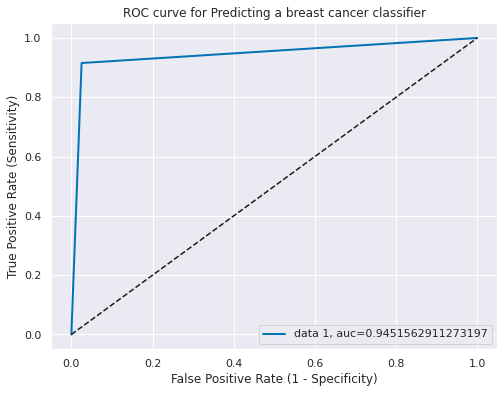

In [86]:
# plot ROC Curve

plt.figure(figsize=(8,6))

fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred)

auc = metrics.roc_auc_score(y_test, y_pred)
print("AUC - ",auc,"\n")

plt.plot(fpr,tpr,linewidth=2, label="data 1, auc="+str(auc))
plt.legend(loc=4)

plt.plot([0,1], [0,1], 'k--' )

plt.rcParams['font.size'] = 12
plt.title('ROC curve for Predicting a breast cancer classifier')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')

plt.show()

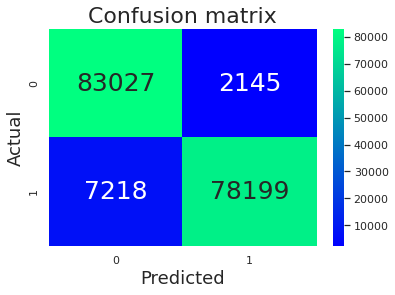

In [87]:
# Heatmap for Confusion Matrix

cnf_matrix = metrics.confusion_matrix(y_test , y_pred)
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, annot_kws={"size": 25}, cmap="winter" ,fmt='g')

plt.title('Confusion matrix', y=1.1, fontsize = 22)
plt.xlabel('Predicted',fontsize = 18)
plt.ylabel('Actual',fontsize = 18)

# ax.xaxis.set_ticklabels(['Genuine', 'Fraud']); 
# ax.yaxis.set_ticklabels(['Genuine', 'Fraud']);

plt.show()

## <a id='logregadasyn'>1.5 Logistic Regression with ADASYN data</a>

In [88]:
print('Original dataset shape %s' % Counter(y))

adasyn = ADASYN(random_state=42)

X_res, y_res = adasyn.fit_resample(X, y)
print('Resampled dataset shape %s' % Counter(y_res))

Original dataset shape Counter({0: 284315, 1: 492})
Resampled dataset shape Counter({1: 284318, 0: 284315})


In [89]:
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size=0.3, shuffle=True, random_state=0)

#  ADASYN Sampling with Logistic Regression
logreg = LogisticRegression()
logreg.fit(X_train, y_train)

y_pred = logreg.predict(X_test)

In [90]:
print('Accuracy :{0:0.5f}'.format(metrics.accuracy_score(y_pred , y_test))) 
print('AUC : {0:0.5f}'.format(metrics.roc_auc_score(y_test , y_pred)))
print('Precision : {0:0.5f}'.format(metrics.precision_score(y_test , y_pred)))
print('Recall : {0:0.5f}'.format(metrics.recall_score(y_test , y_pred)))
print('F1 : {0:0.5f}'.format(metrics.f1_score(y_test , y_pred)))

Accuracy :0.87999
AUC : 0.88001
Precision : 0.90034
Recall : 0.85479
F1 : 0.87697


AUC -  0.8800121853145373 



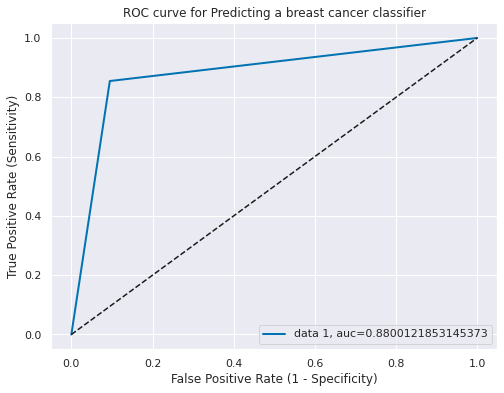

In [91]:
# plot ROC Curve

plt.figure(figsize=(8,6))

fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred)

auc = metrics.roc_auc_score(y_test, y_pred)
print("AUC - ",auc,"\n")

plt.plot(fpr,tpr,linewidth=2, label="data 1, auc="+str(auc))
plt.legend(loc=4)

plt.plot([0,1], [0,1], 'k--' )

plt.rcParams['font.size'] = 12
plt.title('ROC curve for Predicting a breast cancer classifier')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')

plt.show()

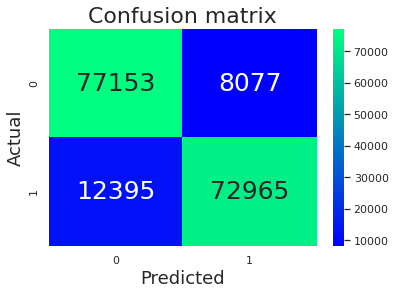

In [92]:
# Heatmap for Confusion Matrix

cnf_matrix = metrics.confusion_matrix(y_test , y_pred)
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, annot_kws={"size": 25}, cmap="winter" ,fmt='g')

plt.title('Confusion matrix', y=1.1, fontsize = 22)
plt.xlabel('Predicted',fontsize = 18)
plt.ylabel('Actual',fontsize = 18)

# ax.xaxis.set_ticklabels(['Genuine', 'Fraud']); 
# ax.yaxis.set_ticklabels(['Genuine', 'Fraud']);

plt.show()

### We have seen that imbalance dataset have Recall score of only 62.59%. It means that creating a model from the imbalanced dataset is highly biased towards genuine transactions and creates a model which is not able to predict the fraudulent transactions correctly. However, the balanced dataset has Recall score of above 85.48%.

# <a id='spatial'>Spatial nature of class imbalance</a>

I will reduce 29 columns to 2 columns with the help of **Principal Component Analysis** so that I can look at them in a plot! (because to plot graph we need two dimensions)

In [1]:
from sklearn.decomposition import PCA

##  <a id='distimbds'>Distribution of balaced dataset</a>

Finally, we can create a scatter plot of the dataset and colour the examples for each class a different colour to clearly see the spatial nature of the class imbalance.

A scatter plot of the dataset is created showing the large mass of points that belong to the minority class (red) and a small number of points spread out for the minority class (blue). We can see some measure of overlap between the two classes.

In [94]:
X_reduced_pca_im = PCA(n_components=2, random_state=42).fit_transform(X)

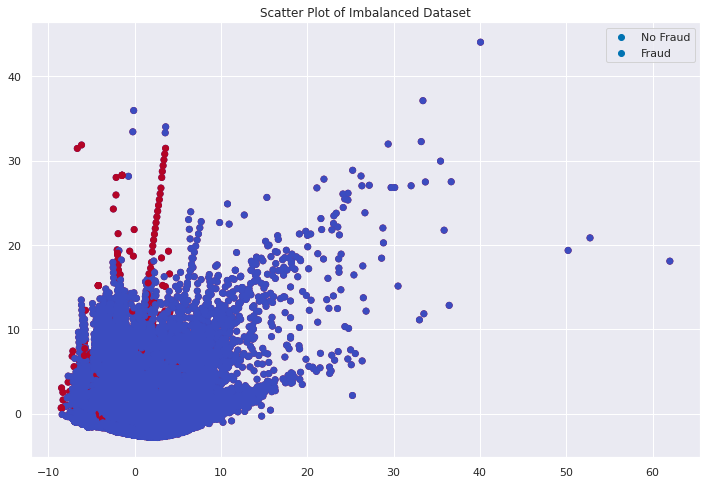

In [95]:
# Generate and plot a synthetic imbalanced classification dataset
plt.figure(figsize=(12,8))

plt.scatter(X_reduced_pca_im[:,0], X_reduced_pca_im[:,1], c=(y == 0), label='No Fraud', cmap='coolwarm', linewidths=1)
plt.scatter(X_reduced_pca_im[:,0], X_reduced_pca_im[:,1], c=(y == 1), label='Fraud', cmap='coolwarm', linewidths=1)

plt.title("Scatter Plot of Imbalanced Dataset")
plt.legend()
plt.show()

## <a id='distbalds'>Distribution of balaced dataset</a>

Finally, a scatter plot of the transformed dataset is created.

It shows many more examples in the minority class created along the lines between the original examples in the minority class.

In [96]:
X_reduced_pca = PCA(n_components=2, random_state=42).fit_transform(X_res)

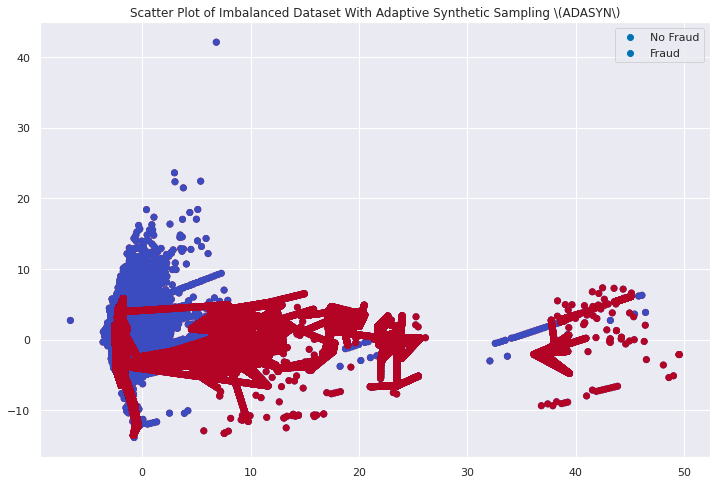

In [97]:
# Oversample and plot imbalanced dataset with ADASYN
plt.figure(figsize=(12,8))

plt.scatter(X_reduced_pca[:,0], X_reduced_pca[:,1], c=(y_res == 0), cmap='coolwarm', label='No Fraud', linewidths=1)
plt.scatter(X_reduced_pca[:,0], X_reduced_pca[:,1], c=(y_res == 1), cmap='coolwarm', label='Fraud', linewidths=1)

plt.title("Scatter Plot of Imbalanced Dataset With Adaptive Synthetic Sampling \(ADASYN\)")
plt.legend()
plt.show()

# <a id='modelwith'>Building different models with different balanced datasets</a>
Let's now try different models , first by creating multiple datasets for undersampled , oversampled and SMOTE sampled

## <a id='usdata'>1. Undersampled Data</a>

In [98]:
print('Original dataset shape %s' % Counter(y))

rus = RandomUnderSampler(random_state=42)
X_under, y_under = rus.fit_resample(X, y)
print('Resampled dataset shape %s' % Counter(y_under))

# Slit into train and test datasets
X_train_under, X_test_under, y_train_under, y_test_under = train_test_split(X_under, y_under, shuffle=True, test_size=0.3, random_state=0)

Original dataset shape Counter({0: 284315, 1: 492})
Resampled dataset shape Counter({0: 492, 1: 492})


## <a id='osdata'>2. Oversampled Data</a>

In [99]:
print('Original dataset shape %s' % Counter(y))

ros = RandomOverSampler(random_state=42)
X_over, y_over = ros.fit_resample(X, y)
print('Resampled dataset shape %s' % Counter(y_over))

# Slit into train and test datasets
X_train_over, X_test_over, y_train_over, y_test_over = train_test_split(X_over, y_over, test_size=0.3, shuffle=True, random_state=0)

Original dataset shape Counter({0: 284315, 1: 492})
Resampled dataset shape Counter({0: 284315, 1: 284315})


## <a id='smotedata'>3. SMOTE Data</a>

In [100]:
print('Original dataset shape %s' % Counter(y))

smote = SMOTE(random_state=42)
X_smote, y_smote = smote.fit_resample(X, y)
print('Resampled dataset shape %s' % Counter(y_smote))

# Slit into train and test datasets
X_train_smote, X_test_smote, y_train_smote, y_test_smote = train_test_split(X_smote, y_smote, test_size=0.3, shuffle=True, random_state=0)

Original dataset shape Counter({0: 284315, 1: 492})
Resampled dataset shape Counter({0: 284315, 1: 284315})


## <a id='adasyndata'>4. ADASYN Data</a>

In [101]:
print('Original dataset shape %s' % Counter(y))

adasyn = ADASYN(random_state=42)
X_adasyn, y_adasyn = adasyn.fit_resample(X, y)
print('Resampled dataset shape %s' % Counter(y_adasyn))

# Slit into train and test datasets
X_train_adasyn, X_test_adasyn, y_train_adasyn, y_test_adasyn = train_test_split(X_adasyn, y_adasyn, test_size=0.3, shuffle=True, random_state=0)

Original dataset shape Counter({0: 284315, 1: 492})
Resampled dataset shape Counter({1: 284318, 0: 284315})


In [102]:
# from sklearn.model_selection import cross_val_score
# from sklearn.model_selection import StratifiedKFold
# from sklearn.linear_model import LogisticRegression
# from sklearn.tree import DecisionTreeClassifier
# # from sklearn.ensemble import RandomForestClassifier
# from sklearn.svm import SVC
# from sklearn.neighbors import KNeighborsClassifier
# from sklearn.naive_bayes import GaussianNB

# # Build Models
# # Let’s test 5 different algorithms:

# # Spot Check Algorithms
# models = []

# #------------------ Logistic Regression (LR) ------------------#
# models.append(('LR imbalance', LogisticRegression(solver='liblinear', multi_class='ovr'),X,y))
# models.append(('LR Undersampling', LogisticRegression(solver='liblinear', multi_class='ovr'),X_under,y_under))
# models.append(('LR Oversampling', LogisticRegression(solver='liblinear', multi_class='ovr'),X_over,y_over))
# models.append(('LR SMOTE', LogisticRegression(solver='liblinear', multi_class='ovr'),X_smote,y_smote))
# # models.append(('LR ADASYN', LogisticRegression(solver='liblinear', multi_class='ovr'),X_adasyn,y_adasyn))

# #-----------------Decision Tree (DT)------------------#
# models.append(('DT imbalance', DecisionTreeClassifier(),X,y))
# models.append(('DT Undersampling', DecisionTreeClassifier(),X_under,y_under))
# models.append(('DT Oversampling', DecisionTreeClassifier(),X_over,y_over))
# models.append(('DT SMOTE', DecisionTreeClassifier(),X_smote,y_smote))
# # models.append(('DT ADASYN', DecisionTreeClassifier(),X_adasyn,y_adasyn))

# #------------------ K-Nearest Neighbors (KNN) ------------------#
# models.append(('KNN imbalance', KNeighborsClassifier(),X,y))
# models.append(('KNN Undersampling', KNeighborsClassifier(),X_under,y_under))
# models.append(('KNN Oversampling', KNeighborsClassifier(),X_over,y_over))
# models.append(('KNN SMOTE', KNeighborsClassifier(),X_smote,y_smote))
# # models.append(('DT ADASYN', KNeighborsClassifier(),X_adasyn,y_adasyn))

# #------------------ Support Vector Machines (SVM) ------------------#
# # models.append(('SVM imbalance', SVC(gamma='auto'),X,y))
# # models.append(('SVM Undersampling', SVC(gamma='auto'),X_under,y_under))
# # models.append(('SVM Oversampling', SVC(gamma='auto'),X_over,y_over))
# # models.append(('SVM SMOTE', SVC(gamma='auto'),X_smote,y_smote))
# # # models.append(('SVM ADASYN', SVC(gamma='auto'),X_adasyn,y_adasyn))

# #------------------ Gaussian Naive Bayes (NB) ------------------#
# models.append(('NB imbalance', GaussianNB(),X,y))
# models.append(('NB Undersampling', GaussianNB(),X_under,y_under))
# models.append(('NB Oversampling', GaussianNB(),X_over,y_over))
# models.append(('NB SMOTE', GaussianNB(),X_smote,y_smote))
# # models.append(('NB ADASYN', GaussianNB(),X_adasyn,y_adasyn))

# # evaluate each model in turn
# names_lst = []
# aucs_lst = []
# accuracy_lst = []
# precision_lst = []
# recall_lst = []
# f1_lst = []

# plt.figure(figsize=(14,8))

# for name, model,Xdata,ydata in models:
    
#     names_lst.append(name)
    
#     # split data in train test set
#     X_train, X_test, y_train, y_test = train_test_split(Xdata, ydata, test_size=0.3, random_state=0)
#     # Build model
#     model.fit(X_train, y_train)
#     # Predict
#     y_pred = model.predict(X_test)
    
#     # calculate accuracy
#     Accuracy = metrics.accuracy_score(y_pred , y_test)
#     accuracy_lst.append(Accuracy)
    
#     # calculate auc
#     Aucs = metrics.roc_auc_score(y_test , y_pred)
#     aucs_lst.append(Aucs)
    
#     # calculate precision
#     PrecisionScore = metrics.precision_score(y_test , y_pred)
#     precision_lst.append(PrecisionScore)
    
#     # calculate recall
#     RecallScore = metrics.recall_score(y_test , y_pred)
#     recall_lst.append(RecallScore)
    
#     # calculate f1 score
#     F1Score = metrics.f1_score(y_test , y_pred)
#     f1_lst.append(F1Score)
    
#     print('F1 Score of '+ name +' model : {0:0.5f}'.format(F1Score))
    
# #     draw confusion matrix
# #     cnf_matrix = metrics.confusion_matrix(y_test , y_pred)

# #     print("Model Name :", name)
# #     print('Accuracy :{0:0.5f}'.format(Accuracy)) 
# #     print('AUC : {0:0.5f}'.format(Aucs))
# #     print('Precision : {0:0.5f}'.format(PrecisionScore))
# #     print('Recall : {0:0.5f}'.format(RecallScore))
# #     print('F1 : {0:0.5f}'.format(F1Score))
# #     print('Confusion Matrix : \n', cnf_matrix)
# #     print("\n")

    
#     # plot ROC Curve
#     fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred)
#     auc = metrics.roc_auc_score(y_test, y_pred)
#     plt.plot(fpr,tpr,linewidth=2, label=name + ", auc="+str(auc))
#     #---------- For loops ends here--------#
    

# plt.legend(loc=4)
# plt.plot([0,1], [0,1], 'k--' )
# plt.rcParams['font.size'] = 12
# plt.title('ROC curve for Predicting a credit card fraud detection')
# plt.xlabel('False Positive Rate (1 - Specificity)')
# plt.ylabel('True Positive Rate (Sensitivity)')
# plt.show()

# data = {'Model':names_lst,
#        'Accuracy':accuracy_lst,
#        'AUC':aucs_lst,
#        'PrecisionScore':precision_lst,
#        'RecallScore':recall_lst,
#        'F1Score':f1_lst}

# print("Performance measures of various classifiers: \n")
# performance_df = pd.DataFrame(data) 
# performance_df.sort_values(['AUC','RecallScore','F1Score','PrecisionScore'],ascending=False)

In [103]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedKFold

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB

In [104]:
names_lst = []

# Empty list to capture performance matrix for train set
aucs_train_lst = []
accuracy_train_lst = []
precision_train_lst = []
recall_train_lst = []
f1_train_lst = []

# Empty list to capture performance matrix for test set
aucs_test_lst = []
accuracy_test_lst = []
precision_test_lst = []
recall_test_lst = []
f1_test_lst = []

# Function for model building and performance measure

def build_measure_model(models):
    plt.figure(figsize=(12,6))

    for name, model,Xdata,ydata in models:
        
        names_lst.append(name)

        # split data in train test set
        X_train, X_test, y_train, y_test = train_test_split(Xdata, ydata, test_size=0.3, shuffle=True, random_state=0)
        
        # Build model
        model.fit(X_train, y_train)
        
        # Predict
        y_train_pred = model.predict(X_train)
        y_test_pred = model.predict(X_test)

        # calculate accuracy
        Accuracy_train = metrics.accuracy_score(y_train, y_train_pred)
        accuracy_train_lst.append(Accuracy_train)
        
        Accuracy_test = metrics.accuracy_score(y_test, y_test_pred)
        accuracy_test_lst.append(Accuracy_test)

        # calculate auc
        Aucs_train = metrics.roc_auc_score(y_train, y_train_pred)
        aucs_train_lst.append(Aucs_train)
        
        Aucs_test = metrics.roc_auc_score(y_test , y_test_pred)
        aucs_test_lst.append(Aucs_test)

        # calculate precision
        PrecisionScore_train = metrics.precision_score(y_train , y_train_pred)
        precision_train_lst.append(PrecisionScore_train)
        
        PrecisionScore_test = metrics.precision_score(y_test , y_test_pred)
        precision_test_lst.append(PrecisionScore_test)

        # calculate recall
        RecallScore_train = metrics.recall_score(y_train , y_train_pred)
        recall_train_lst.append(RecallScore_train)
        
        RecallScore_test = metrics.recall_score(y_test , y_test_pred)
        recall_test_lst.append(RecallScore_test)

        # calculate f1 score
        F1Score_train = metrics.f1_score(y_train , y_train_pred)
        f1_train_lst.append(F1Score_train)
        
        F1Score_test = metrics.f1_score(y_test , y_test_pred)
        f1_test_lst.append(F1Score_test)

        #print('F1 Score of '+ name +' model : {0:0.5f}'.format(F1Score_test))

        # draw confusion matrix
        cnf_matrix = metrics.confusion_matrix(y_test , y_test_pred)

        print("Model Name :", name)
        
        print('Train Accuracy :{0:0.5f}'.format(Accuracy_train)) 
        print('Test Accuracy :{0:0.5f}'.format(Accuracy_test))
        
        print('Train AUC : {0:0.5f}'.format(Aucs_train))
        print('Test AUC : {0:0.5f}'.format(Aucs_test))
        
        print('Train Precision : {0:0.5f}'.format(PrecisionScore_train))
        print('Test Precision : {0:0.5f}'.format(PrecisionScore_test))
        
        print('Train Recall : {0:0.5f}'.format(RecallScore_train))
        print('Test Recall : {0:0.5f}'.format(RecallScore_test))
        
        print('Train F1 : {0:0.5f}'.format(F1Score_train))
        print('Test F1 : {0:0.5f}'.format(F1Score_test))
        
        print('Confusion Matrix : \n', cnf_matrix)
        print("\n")


        # plot ROC Curve
        fpr, tpr, thresholds = metrics.roc_curve(y_test, y_test_pred)
        auc = metrics.roc_auc_score(y_test, y_test_pred)
        plt.plot(fpr,tpr,linewidth=2, label=name + ", auc="+str(auc))
    
        #---------- For loops ends here--------#


    plt.legend(loc=4)
    plt.plot([0,1], [0,1], 'k--' )
    plt.rcParams['font.size'] = 12
    plt.title('ROC curve for Predicting a credit card fraud detection')
    plt.xlabel('False Positive Rate (1 - Specificity)')
    plt.ylabel('True Positive Rate (Sensitivity)')
    plt.show()

### Logistic Regression (LR)

Model Name : LR imbalance
Train Accuracy :0.99921
Test Accuracy :0.99922
Train AUC : 0.81297
Test AUC : 0.80946
Train Precision : 0.88525
Test Precision : 0.89216
Train Recall : 0.62609
Test Recall : 0.61905
Train F1 : 0.73345
Test F1 : 0.73092
Confusion Matrix : 
 [[85285    11]
 [   56    91]]


Model Name : LR Undersampling
Train Accuracy :0.95640
Test Accuracy :0.93919
Train AUC : 0.95632
Test AUC : 0.93932
Train Precision : 0.98154
Test Precision : 0.95804
Train Recall : 0.93003
Test Recall : 0.91946
Train F1 : 0.95509
Test F1 : 0.93836
Confusion Matrix : 
 [[141   6]
 [ 12 137]]


Model Name : LR Oversampling
Train Accuracy :0.94607
Test Accuracy :0.94523
Train AUC : 0.94605
Test AUC : 0.94527
Train Precision : 0.97568
Test Precision : 0.97444
Train Recall : 0.91488
Test Recall : 0.91461
Train F1 : 0.94430
Test F1 : 0.94358
Confusion Matrix : 
 [[83123  2049]
 [ 7294 78123]]


Model Name : LR SMOTE
Train Accuracy :0.94512
Test Accuracy :0.94507
Train AUC : 0.94510
Test AUC : 0.94

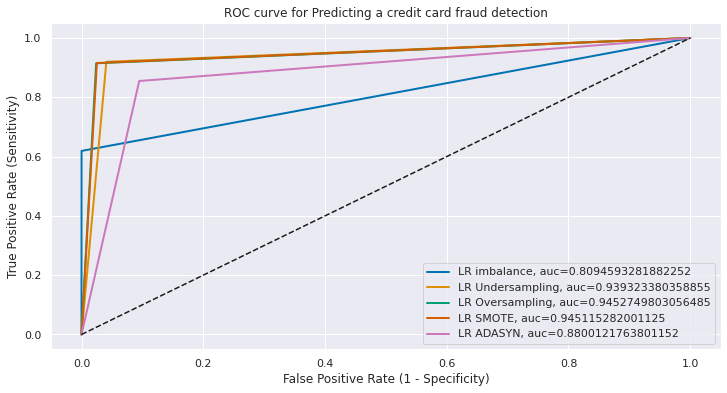

In [105]:
#------------------ Logistic Regression (LR) ------------------#
LRmodels = []

LRmodels.append(('LR imbalance', LogisticRegression(solver='liblinear', multi_class='ovr'),X,y))
LRmodels.append(('LR Undersampling', LogisticRegression(solver='liblinear', multi_class='ovr'),X_under,y_under))
LRmodels.append(('LR Oversampling', LogisticRegression(solver='liblinear', multi_class='ovr'),X_over,y_over))
LRmodels.append(('LR SMOTE', LogisticRegression(solver='liblinear', multi_class='ovr'),X_smote,y_smote))
LRmodels.append(('LR ADASYN', LogisticRegression(solver='liblinear', multi_class='ovr'),X_adasyn,y_adasyn))

# Call function to create model and measure its performance
build_measure_model(LRmodels)

### Decision Tree (DT)

Model Name : DT imbalance
Train Accuracy :1.00000
Test Accuracy :0.99919
Train AUC : 1.00000
Test AUC : 0.87396
Train Precision : 1.00000
Test Precision : 0.77465
Train Recall : 1.00000
Test Recall : 0.74830
Train F1 : 1.00000
Test F1 : 0.76125
Confusion Matrix : 
 [[85264    32]
 [   37   110]]


Model Name : DT Undersampling
Train Accuracy :1.00000
Test Accuracy :0.86824
Train AUC : 1.00000
Test AUC : 0.86840
Train Precision : 1.00000
Test Precision : 0.88732
Train Recall : 1.00000
Test Recall : 0.84564
Train F1 : 1.00000
Test F1 : 0.86598
Confusion Matrix : 
 [[131  16]
 [ 23 126]]


Model Name : DT Oversampling
Train Accuracy :1.00000
Test Accuracy :0.99977
Train AUC : 1.00000
Test AUC : 0.99977
Train Precision : 1.00000
Test Precision : 0.99953
Train Recall : 1.00000
Test Recall : 1.00000
Train F1 : 1.00000
Test F1 : 0.99977
Confusion Matrix : 
 [[85132    40]
 [    0 85417]]


Model Name : DT SMOTE
Train Accuracy :1.00000
Test Accuracy :0.99798
Train AUC : 1.00000
Test AUC : 0.99

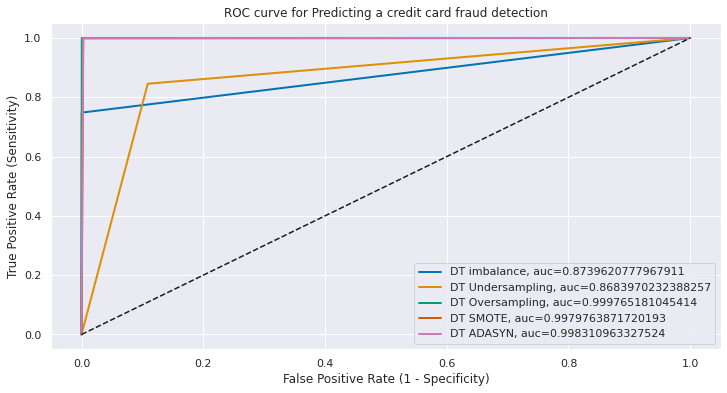

In [106]:
#-----------------Decision Tree (DT)------------------#
DTmodels = []

dt = DecisionTreeClassifier()

DTmodels.append(('DT imbalance', dt,X,y))
DTmodels.append(('DT Undersampling', dt,X_under,y_under))
DTmodels.append(('DT Oversampling', dt,X_over,y_over))
DTmodels.append(('DT SMOTE', dt,X_smote,y_smote))
DTmodels.append(('DT ADASYN', dt,X_adasyn,y_adasyn))

# Call function to create model and measure its performance
build_measure_model(DTmodels)

### Random Forest (RF)

Model Name : RF imbalance
Train Accuracy :1.00000
Test Accuracy :0.99950
Train AUC : 1.00000
Test AUC : 0.87072
Train Precision : 1.00000
Test Precision : 0.95614
Train Recall : 1.00000
Test Recall : 0.74150
Train F1 : 1.00000
Test F1 : 0.83525
Confusion Matrix : 
 [[85291     5]
 [   38   109]]


Model Name : RF Undersampling
Train Accuracy :1.00000
Test Accuracy :0.94257
Train AUC : 1.00000
Test AUC : 0.94295
Train Precision : 1.00000
Test Precision : 1.00000
Train Recall : 1.00000
Test Recall : 0.88591
Train F1 : 1.00000
Test F1 : 0.93950
Confusion Matrix : 
 [[147   0]
 [ 17 132]]


Model Name : RF Oversampling
Train Accuracy :1.00000
Test Accuracy :0.99996
Train AUC : 1.00000
Test AUC : 0.99996
Train Precision : 1.00000
Test Precision : 0.99993
Train Recall : 1.00000
Test Recall : 1.00000
Train F1 : 1.00000
Test F1 : 0.99996
Confusion Matrix : 
 [[85166     6]
 [    0 85417]]


Model Name : RF SMOTE
Train Accuracy :1.00000
Test Accuracy :0.99989
Train AUC : 1.00000
Test AUC : 0.99

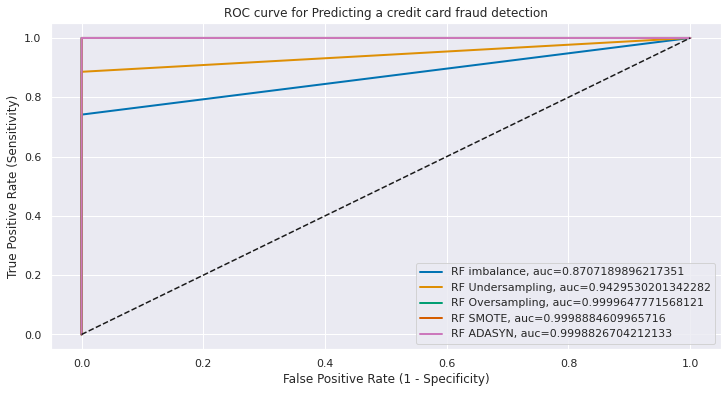

In [107]:
#-----------------Random Forest (RF) ------------------#
RFmodels = []

RFmodels.append(('RF imbalance', RandomForestClassifier(),X,y))
RFmodels.append(('RF Undersampling', RandomForestClassifier(),X_under,y_under))
RFmodels.append(('RF Oversampling', RandomForestClassifier(),X_over,y_over))
RFmodels.append(('RF SMOTE', RandomForestClassifier(),X_smote,y_smote))
RFmodels.append(('RF ADASYN', RandomForestClassifier(),X_adasyn,y_adasyn))

# Call function to create model and measure its performance
build_measure_model(RFmodels)

In [108]:
# #------------------ K-Nearest Neighbors (KNN) ------------------#
# KNNmodels = []

# KNNmodels.append(('KNN imbalance', KNeighborsClassifier(),X,y))
# KNNmodels.append(('KNN Undersampling', KNeighborsClassifier(),X_under,y_under))
# KNNmodels.append(('KNN Oversampling', KNeighborsClassifier(),X_over,y_over))
# KNNmodels.append(('KNN SMOTE', KNeighborsClassifier(),X_smote,y_smote))
# KNNmodels.append(('KNN ADASYN', KNeighborsClassifier(),X_adasyn,y_adasyn))

# Call function to create model and measure its performance
# build_measure_model(KNNmodels)

In [109]:
# #------------------ Support Vector Machines (SVM) ------------------#
# SVMmodels = []

# SVMmodels.append(('SVM imbalance', SVC(gamma='auto'),X,y))
# SVMmodels.append(('SVM Undersampling', SVC(gamma='auto'),X_under,y_under))
# SVMmodels.append(('SVM Oversampling', SVC(gamma='auto'),X_over,y_over))
# SVMmodels.append(('SVM SMOTE', SVC(gamma='auto'),X_smote,y_smote))
# SVMmodels.append(('SVM ADASYN', SVC(gamma='auto'),X_adasyn,y_adasyn))

# Call function to create model and measure its performance
# build_measure_model(SVMmodels)

### Naive Bayes (NB)

Model Name : NB imbalance
Train Accuracy :0.97793
Test Accuracy :0.97851
Train AUC : 0.90214
Test AUC : 0.90775
Train Precision : 0.06162
Test Precision : 0.06357
Train Recall : 0.82609
Test Recall : 0.83673
Train F1 : 0.11469
Test F1 : 0.11816
Confusion Matrix : 
 [[83484  1812]
 [   24   123]]


Model Name : NB Undersampling
Train Accuracy :0.91860
Test Accuracy :0.92905
Train AUC : 0.91844
Test AUC : 0.92953
Train Precision : 0.97049
Test Precision : 1.00000
Train Recall : 0.86297
Test Recall : 0.85906
Train F1 : 0.91358
Test F1 : 0.92419
Confusion Matrix : 
 [[147   0]
 [ 21 128]]


Model Name : NB Oversampling
Train Accuracy :0.91611
Test Accuracy :0.91606
Train AUC : 0.91608
Test AUC : 0.91614
Train Precision : 0.97078
Test Precision : 0.97055
Train Recall : 0.85795
Test Recall : 0.85840
Train F1 : 0.91088
Test F1 : 0.91104
Confusion Matrix : 
 [[82947  2225]
 [12095 73322]]


Model Name : NB SMOTE
Train Accuracy :0.91429
Test Accuracy :0.91414
Train AUC : 0.91425
Test AUC : 0.91

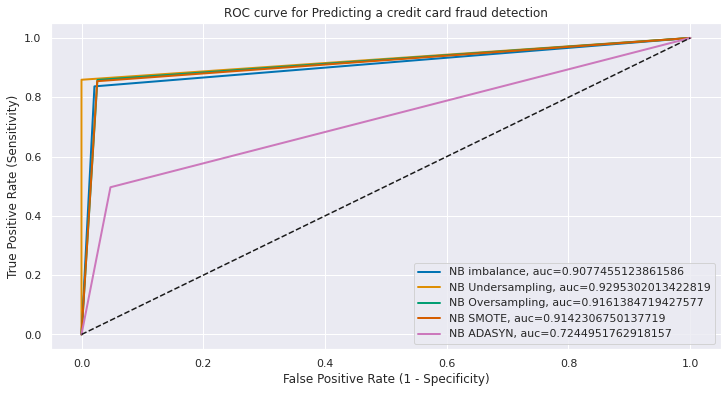

In [110]:
#------------------ Gaussian Naive Bayes (NB) ------------------#
NBmodels = []

NBmodels.append(('NB imbalance', GaussianNB(),X,y))
NBmodels.append(('NB Undersampling', GaussianNB(),X_under,y_under))
NBmodels.append(('NB Oversampling', GaussianNB(),X_over,y_over))
NBmodels.append(('NB SMOTE', GaussianNB(),X_smote,y_smote))
NBmodels.append(('NB ADASYN', GaussianNB(),X_adasyn,y_adasyn))

# Call function to create model and measure its performance
build_measure_model(NBmodels)

### Performance measures of various classifiers

In [111]:
data = {'Model':names_lst,
       'Accuracy_Train':accuracy_train_lst,
       'Accuracy_Test':accuracy_test_lst,
       'AUC_Train':aucs_train_lst,
       'AUC_Test':aucs_test_lst,
       'PrecisionScore_Train':precision_train_lst,
       'PrecisionScore_Test':precision_test_lst,
       'RecallScore_Train':recall_train_lst,
       'RecallScore_Test':recall_test_lst,
       'F1Score_Train':f1_train_lst,
       'F1Score_Test':f1_test_lst}

print("Performance measures of various classifiers: \n")
performance_df = pd.DataFrame(data) 
performance_df.sort_values(['AUC_Test','RecallScore_Test','F1Score_Test'],ascending=False)

Performance measures of various classifiers: 



,Model,Accuracy_Train,Accuracy_Test,AUC_Train,AUC_Test,PrecisionScore_Train,PrecisionScore_Test,RecallScore_Train,RecallScore_Test,F1Score_Train,F1Score_Test
12,RF Oversampling,1.000000,0.999965,1.000000,0.999965,1.000000,0.999930,1.000000,1.000000,1.000000,0.999965
13,RF SMOTE,1.000000,0.999889,1.000000,0.999888,1.000000,0.999778,1.000000,1.000000,1.000000,0.999889
14,RF ADASYN,1.000000,0.999883,1.000000,0.999883,1.000000,0.999766,1.000000,1.000000,1.000000,0.999883
7,DT Oversampling,1.000000,0.999766,1.000000,0.999765,1.000000,0.999532,1.000000,1.000000,1.000000,0.999766
9,DT ADASYN,1.000000,0.998312,1.000000,0.998311,1.000000,0.997299,1.000000,0.999332,1.000000,0.998315
8,DT SMOTE,1.000000,0.997978,1.000000,0.997976,1.000000,0.997148,1.000000,0.998818,1.000000,0.997982
2,LR Oversampling,0.946071,0.945231,0.946052,0.945275,0.975684,0.974442,0.914876,0.914607,0.944302,0.943577
3,LR SMOTE,0.945121,0.945073,0.945102,0.945115,0.974111,0.973276,0.914479,0.915438,0.943354,0.943472
11,RF Undersampling,1.000000,0.942568,1.000000,0.942953,1.000000,1.000000,1.000000,0.885906,1.000000,0.939502
1,LR Undersampling,0.956395,0.939189,0.956319,0.939323,0.981538,0.958042,0.930029,0.919463,0.955090,0.938356


**Hightlights**

After training each of the models, these are the final results. All of the scores for Random Forest with Oversampling technique and the Random Forest with SMOTE technique models are very promising for our dataset! Each model has a high true positive rate and a low false-positive rate, which is exactly what we’re looking for.


In the ROC graph above, the AUC scores for Random Forest with Oversampling technique is pretty high, which is what we’d like to see. As we move further right along the curve, we both capture more True Positives but also incur more False Positives. This means we capture more fraudulent transactions, but also flag even more normal transactions as fraudulent.
 
**So Random Forest with Oversampling technique  is our final model, as this gives highest Recall score of 100% on both train and test datasets.**

# <a id='gridsearch'>Grid Search</a>

Grid search is the process of performing hyper parameter tuning in order to determine the optimal values for a given model. This is significant as the performance of the entire model is based on the hyper parameter values specified.

A **model hyperparameter** is a characteristic of a model that is external to the model and whose value cannot be estimated from data. The value of the hyperparameter has to be set before the learning process begins. For example, c in Support Vector Machines, k in k-Nearest Neighbors, the number of hidden layers in Neural Networks.

In contrast, a **parameter** is an internal characteristic of the model and its value can be estimated from data. Example, beta coefficients of linear/logistic regression or support vectors in Support Vector Machines.

Ref: 
* https://medium.com/datadriveninvestor/an-introduction-to-grid-search-ff57adcc0998
* https://towardsdatascience.com/grid-search-for-hyperparameter-tuning-9f63945e8fec
* https://www.youtube.com/watch?v=Gol_qOgRqfA

**Youtube**

In [2]:
YouTubeVideo('Gol_qOgRqfA', width=800, height=400)

NameError: name 'YouTubeVideo' is not defined

In [113]:
# Use GridSearchCV to find the best parameters.
from sklearn.model_selection import GridSearchCV

## <a id='gridsearchLR'> 1. Grid Search with Logistic Regression</a>

In [114]:
#------------ Logistic Regression ------------#
log_reg_params = {"solver": ['saga'],
                  "penalty": ['l1', 'l2'], 
                  'C':  [0.01, 0.1, 1, 10, 100], 
                  "max_iter" : [100000]},

grid_log_reg = GridSearchCV(LogisticRegression(), log_reg_params)
grid_log_reg.fit(X_train_under,y_train_under)

# Logistic Regression best estimator
print("Logistic Regression best estimator : \n",grid_log_reg.best_estimator_)

# predict test dataset
y_pred_lr = grid_log_reg.predict(X_test_under)

# f1 score
print('\nLogistic Regression f1 Score : {0:0.5f}'.format(metrics.f1_score(y_test_under , y_pred_lr)))

Logistic Regression best estimator : 
 LogisticRegression(C=0.1, max_iter=100000, penalty='l1', solver='saga')

Logistic Regression f1 Score : 0.92857


## <a id='gridsearchKNN'> 2. Grid Search with K Nearest Neighbour Classifier</a>

In [115]:
#------------ K Nearest Neighbour ------------#
knears_params = {"n_neighbors": list(range(2,60,1)), 
                 'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute']}

grid_knears = GridSearchCV(KNeighborsClassifier(), knears_params)

grid_knears.fit(X_train_under,y_train_under)

# KNears best estimator
print("KNN best estimator : \n",grid_knears.best_estimator_)

# predict test dataset
y_pred_knn = grid_knears.predict(X_test_under)

# f1 score
print('\nKNN f1 Score : {0:0.5f}'.format(metrics.f1_score(y_test_under , y_pred_knn)))

KNN best estimator : 
 KNeighborsClassifier()

KNN f1 Score : 0.92473


## <a id='gridsearchSVC'> 3. Grid Search with Support Vector Classifier</a>

In [116]:
#------------ Support Vector Classifier ------------#
svc_params = {'C': [0.5, 0.7, 0.9, 1], 
              'kernel': ['rbf', 'poly', 'sigmoid', 'linear']}

grid_svc = GridSearchCV(SVC(), svc_params)
grid_svc.fit(X_train_under,y_train_under)

# SVC best estimator
print("SVC best estimator : \n",grid_svc.best_estimator_)

# predict test dataset
y_pred_svc = grid_svc.predict(X_test_under)

# f1 score
print('\nSVC f1 Score : {0:0.5f}'.format(metrics.f1_score(y_test_under , y_pred_svc)))

SVC best estimator : 
 SVC(C=0.9)

SVC f1 Score : 0.92419


## <a id='gridsearchDT'> 4. Grid Search with Decision Tree Classifier</a>

In [117]:
#------------ DecisionTree Classifier ------------#
tree_params = {"criterion": ["gini", "entropy"], 
               "max_depth": list(range(2,4,1)), 
               "min_samples_leaf": list(range(5,7,1))}

grid_tree = GridSearchCV(estimator = DecisionTreeClassifier(),
                        param_grid = tree_params,
                        scoring = 'accuracy', 
                        cv = 5, 
                        verbose = 1,
                        n_jobs = -1)


grid_tree.fit(X_train_under,y_train_under)

# tree best estimator
print("Decision Tree best estimator : \n",grid_tree.best_estimator_)

# predict test dataset
y_pred_dt = grid_tree.predict(X_test_under)


# f1 score
print('\nf1 Score : {0:0.5f}'.format(metrics.f1_score(y_test_under , y_pred_dt)))

Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.


Decision Tree best estimator : 
 DecisionTreeClassifier(criterion='entropy', max_depth=3, min_samples_leaf=5)

f1 Score : 0.92029


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    1.5s finished


# <a id='concl'>Conclusion</a>

We were able to accurately identify fraudulent credit card transactions using a random forest model with oversampling technique. We, therefore, chose the random forest model with oversampling technique as the better model, which obtained recall score of 99% on the test set.

**I hope I was able to explain my findings well and thanks so much for reading!**


### I welcome comments, suggestions, corrections and of course votes also.